## DS4A final poster analysis
Parking data in San Francisco by neighborhood and zip code

In [10]:
# import libraries
import pandas as pd
import numpy as np 
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as plt_dt
from fbprophet import Prophet as p # module from Facebook for time series analyses 

import warnings
warnings.filterwarnings('ignore')

### Data import and cleaning 

In [2]:
# read in data
nbhd = pd.read_csv('data/total_nhood_parking_meter.csv')
zpc = pd.read_csv('data/total_zips_parking_meter.csv')
nbhd1920 = pd.read_csv('data/total_nhood_parking_meter_2019_2020.csv')

In [3]:
# look at data
print(nbhd1920.shape)
nbhd1920.head()

(13877, 4)


,start_date_new,nhood,num_parking_meters,wday
0,2019-11-01,Bayview Hunters Point,111,6
1,2019-11-01,Bernal Heights,1136,6
2,2019-11-01,Castro/Upper Market,1903,6
3,2019-11-01,Chinatown,1999,6
4,2019-11-01,Excelsior,1031,6


In [4]:
print(zpc.shape)
zpc.head()

(9670, 4)


,start_date_new,zip,num_parking_meters,wday
0,2019-11-01,94102.0,4128,6
1,2019-11-01,94103.0,6411,6
2,2019-11-01,94104.0,454,6
3,2019-11-01,94105.0,2839,6
4,2019-11-01,94107.0,5801,6


In [3]:
# fix datetimes
zpc['date'] = pd.to_datetime(zpc.start_date_new, infer_datetime_format=True) 
nbhd['date'] = pd.to_datetime(nbhd.start_date_new, infer_datetime_format=True) 
nbhd1920['date'] = pd.to_datetime(nbhd1920.start_date_new, infer_datetime_format=True) 

In [6]:
# create new time categories: period

# define date ranges
p1_start = datetime.datetime(2017, 11, 1)
p1_end = datetime.datetime(2018, 3, 31)
p2_start = datetime.datetime(2018, 11, 1)
p2_end = datetime.datetime(2019, 3, 31)
p3_start = datetime.datetime(2019, 11, 1)
p3_end = datetime.datetime(2020, 3, 31)

def label_period(row):
    if row['date'] >= p1_start and row['date'] <= p1_end:
        return 'Nov17-Mar18'
    if row['date'] >= p2_start and row['date'] <= p2_end:
        return 'Nov18-Mar19'
    if row['date'] >= p3_start and row['date'] <= p3_end:
        return 'Nov19-Mar20'
    return 'Other'

nbhd['period']=nbhd.apply(lambda row: label_period(row), axis=1)
zpc['period']=zpc.apply(lambda row: label_period(row), axis=1)

In [7]:
# create new time categories: Marches

# define date ranges
p1_start = datetime.datetime(2018, 3, 1)
p1_end = datetime.datetime(2018, 3, 31)
p2_start = datetime.datetime(2019, 3, 1)
p2_end = datetime.datetime(2019, 3, 31)
p3_start = datetime.datetime(2020, 3, 1)
p3_end = datetime.datetime(2020, 3, 31)

def label_march(row):
    if row['date'] >= p1_start and row['date'] <= p1_end:
        return '2018'
    if row['date'] >= p2_start and row['date'] <= p2_end:
        return '2019'
    if row['date'] >= p3_start and row['date'] <= p3_end:
        return '2020'
    return np.nan

nbhd['march']=nbhd.apply(lambda row: label_march(row), axis=1)
zpc['march']=zpc.apply(lambda row: label_march(row), axis=1)
nbhd1920['march']=nbhd.apply(lambda row: label_march(row), axis=1)

In [8]:
# categorize neighborhoods
def label_nhood(row):
    if row['nhood']=='Chinatown':
        return 1
    if row['nhood']=='Japantown':
        return 1
    if row['nhood']=='Inner Sunset':
        return 1
    return 0

nbhd['asian_nhood']=nbhd.apply(lambda row: label_nhood(row), axis=1)
nbhd1920['asian_nhood']=nbhd.apply(lambda row: label_nhood(row), axis=1)

### Analysis

In [7]:
# define datasets for different parts of analysis
n_p1 = nbhd[nbhd['period']=='Nov17-Mar18']
n_p2 = nbhd[nbhd['period']=='Nov18-Mar19']
n_p3 = nbhd[nbhd['period']=='Nov19-Mar20']

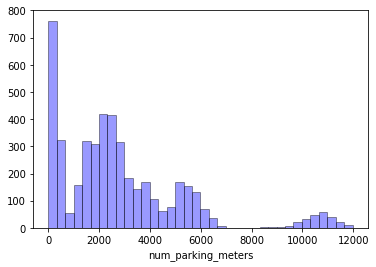

In [12]:
# plotting neighborhood distributions by time and neighborhood
# seaborn histogram: period 1
sns.distplot(n_p1['num_parking_meters'], hist=True, kde=False, 
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

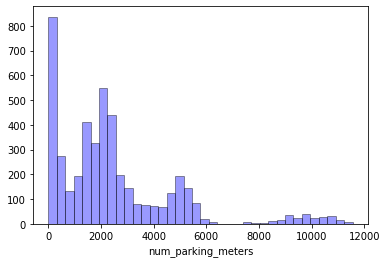

In [98]:
# seaborn histogram: period 2
sns.distplot(n_p2['num_parking_meters'], hist=True, kde=False, 
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

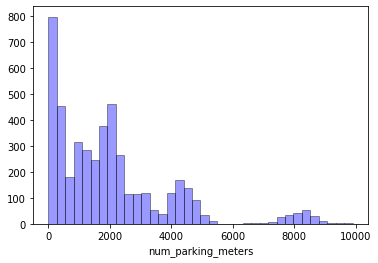

In [99]:
# seaborn histogram: period 3
sns.distplot(n_p3['num_parking_meters'], hist=True, kde=False, 
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [107]:
n_p3[n_p3['num_parking_meters']>6000].head() # mostly fidi and the mission

,start_date_new,nhood,num_parking_meters,wday,date,period,march,asian_nhood
5,2019-11-01,Financial District/South Beach,8389,6,2019-11-01,Nov19-Mar20,NaN,0
16,2019-11-01,Mission,9236,6,2019-11-01,Nov19-Mar20,NaN,0
41,2019-11-02,Financial District/South Beach,9676,7,2019-11-02,Nov19-Mar20,NaN,0
52,2019-11-02,Mission,8582,7,2019-11-02,Nov19-Mar20,NaN,0
77,2019-11-04,Financial District/South Beach,7954,2,2019-11-04,Nov19-Mar20,NaN,0


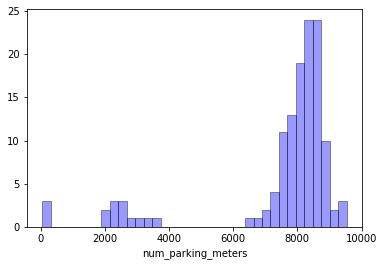

In [13]:
# hist by time frame for a single neighborhood
x = n_p3[n_p3['nhood']=='Mission']
sns.distplot(x['num_parking_meters'], hist=True, kde=False, 
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

### Time series analysis
following this post: https://towardsdatascience.com/time-series-analysis-in-python-an-introduction-70d5a5b1d52a


In [8]:
# define neighborhood dataframe
mission_p3 = n_p3[n_p3['nhood']=='Mission']

# define function to create a new column with the mean for Feb
def mean_from_month(dataframe,month_num):
    dataframe['month']=dataframe.apply(lambda row: row['date'].month, axis=1) # get months
    df_mon=dataframe[dataframe['month']==month_num] # df limited to feb
    avg=df_mon.num_parking_meters.mean() # find average parking meter use in feb
    dataframe['avg_{}'.format(str(month_num))]=avg # save to the whole df
    return dataframe

mission_p3 = mean_from_month(mission_p3,2)

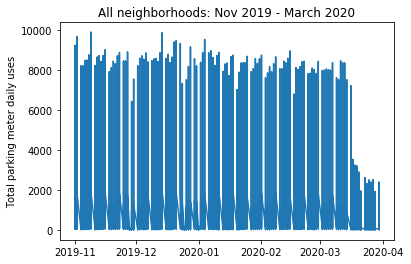

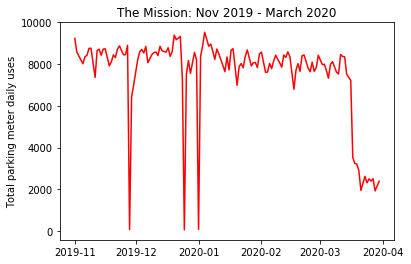

In [16]:
plt.plot(n_p3.date, n_p3.num_parking_meters)
plt.title('All neighborhoods: Nov 2019 - March 2020')
plt.ylabel('Total parking meter daily uses');
plt.show()
plt.plot(mission_p3.date, mission_p3.num_parking_meters, 'r')
plt.title('The Mission: Nov 2019 - March 2020')
plt.ylabel('Total parking meter daily uses');
plt.show();

In [56]:
mission_ts = mission_p3[mission_p3['date']<datetime.datetime(2020,3,1)] # limit to 3 months prior to March 
mission_ts = mission_ts.rename(columns={'date': 'ds', 'num_parking_meters': 'y'}) # rename columns to Prophet's req

# Make the prophet model and fit on the data
mission_prophet = p(changepoint_prior_scale=0.20)
#mission_prophet.add_country_holidays(country_name='US') # tell it about holidays 
mission_prophet.fit(mission_ts)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [57]:
# create prediction dataframe 
# Make a future dataframe for month of March 
mission_forecast = mission_prophet.make_future_dataframe(periods=31, freq='D')
# Make predictions
mission_pred = mission_prophet.predict(mission_forecast)

In [58]:
mission_pred.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
130,2020-03-27,7989.027122,6395.638433,9994.169775,7981.053960,7997.808238,393.468611,393.468611,393.468611,393.468611,393.468611,393.468611,0.0,0.0,0.0,8382.495733
131,2020-03-28,7987.956734,6630.266906,10059.378902,7979.300528,7997.119010,385.503602,385.503602,385.503602,385.503602,385.503602,385.503602,0.0,0.0,0.0,8373.460336
132,2020-03-29,7986.886346,6667.842181,10308.303503,7977.817890,7996.503020,457.689344,457.689344,457.689344,457.689344,457.689344,457.689344,0.0,0.0,0.0,8444.575690
133,2020-03-30,7985.815958,6030.031071,9719.305459,7976.178318,7995.934283,-55.599202,-55.599202,-55.599202,-55.599202,-55.599202,-55.599202,0.0,0.0,0.0,7930.216757
134,2020-03-31,7984.745571,6115.809398,9764.793791,7974.673719,7995.320468,6.764240,6.764240,6.764240,6.764240,6.764240,6.764240,0.0,0.0,0.0,7991.509810


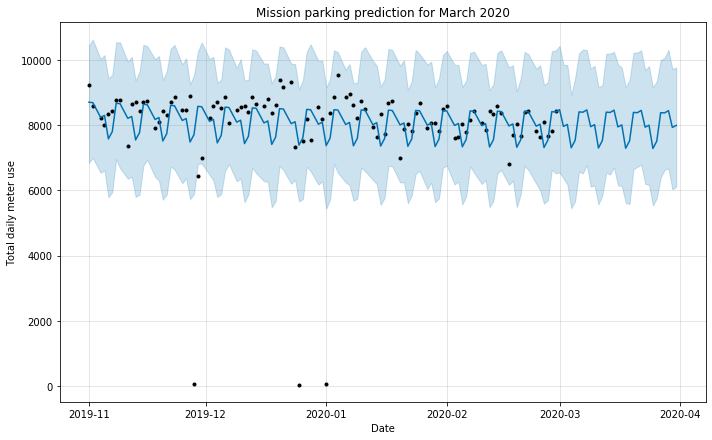

In [59]:
mission_prophet.plot(mission_pred, xlabel = 'Date', ylabel = 'Total daily meter use')
plt.title('Mission parking prediction for March 2020');

In [161]:
mission_pred

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-11-01,8308.942387,6846.915193,10446.808833,8308.942387,8308.942387,393.468611,393.468611,393.468611,393.468611,393.468611,393.468611,0.0,0.0,0.0,8702.410998
1,2019-11-02,8304.366116,6997.024417,10620.240455,8304.366116,8304.366116,385.503602,385.503602,385.503602,385.503602,385.503602,385.503602,0.0,0.0,0.0,8689.869718
2,2019-11-04,8295.213573,6538.827166,10027.992668,8295.213573,8295.213573,-55.599202,-55.599202,-55.599202,-55.599202,-55.599202,-55.599202,0.0,0.0,0.0,8239.614371
3,2019-11-05,8290.637302,6609.485410,10145.017210,8290.637302,8290.637302,6.764240,6.764240,6.764240,6.764240,6.764240,6.764240,0.0,0.0,0.0,8297.401541
4,2019-11-06,8286.061031,5788.843929,9435.548284,8286.061031,8286.061031,-707.680063,-707.680063,-707.680063,-707.680063,-707.680063,-707.680063,0.0,0.0,0.0,7578.380968
5,2019-11-07,8281.484760,5947.123969,9542.886139,8281.484760,8281.484760,-480.146532,-480.146532,-480.146532,-480.146532,-480.146532,-480.146532,0.0,0.0,0.0,7801.338228
6,2019-11-08,8276.908489,6959.720528,10541.006143,8276.908489,8276.908489,393.468611,393.468611,393.468611,393.468611,393.468611,393.468611,0.0,0.0,0.0,8670.377100
7,2019-11-09,8272.332218,6675.461437,10534.890156,8272.332218,8272.332218,385.503602,385.503602,385.503602,385.503602,385.503602,385.503602,0.0,0.0,0.0,8657.835820
8,2019-11-11,8263.179676,6358.116482,9944.067143,8263.179676,8263.179676,-55.599202,-55.599202,-55.599202,-55.599202,-55.599202,-55.599202,0.0,0.0,0.0,8207.580475
9,2019-11-12,8258.603405,6417.258332,10092.392446,8258.603405,8258.603405,6.764240,6.764240,6.764240,6.764240,6.764240,6.764240,0.0,0.0,0.0,8265.367645


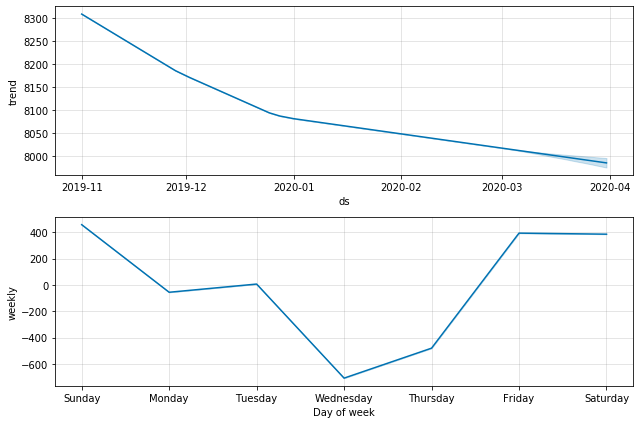

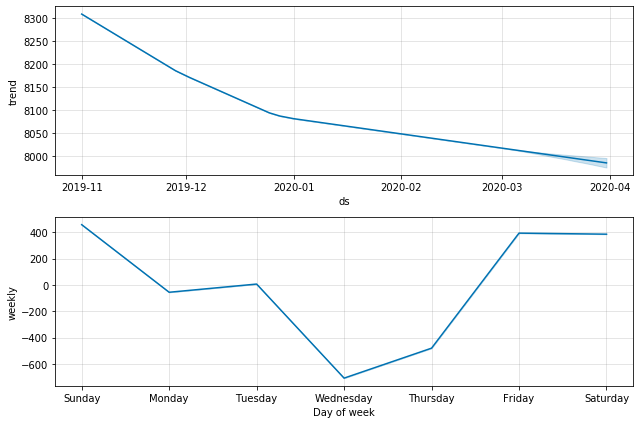

In [159]:
mission_prophet.plot_components(mission_pred)

In [162]:
# comparing to what actually happened
pred_small = mission_pred[['ds','trend','yhat','yhat_lower','yhat_upper']] # only save columns you want from predict df
pred_march = pred_small[pred_small['ds']>=datetime.datetime(2020,3,1)] # restrict to March
#pred_march = pred_march.rename(columns={'ds': 'date'}) # rename column
pred_march.reset_index(inplace=True,drop=True)
pred_march.drop([0,7,14,21,28,30], inplace=True) # drop sundays
pred_march.reset_index(inplace=True,drop=True)

mission_march = mission_p3[mission_p3['date']>=datetime.datetime(2020,3,1)] # restrict to March
mission_march.reset_index(drop=True, inplace=True) # reset index

mission_final = pd.concat([mission_march, pred_march], axis=1, sort=False)
mission_final.drop('ds', axis=1, inplace=True)
mission_final

,start_date_new,nhood,num_parking_meters,wday,date,period,march,asian_nhood,month,avg_2,trend,yhat,yhat_lower,yhat_upper
0,2020-03-02,Mission,7978,2,2020-03-02,Nov19-Mar20,2020,0,3,8013.92,8015.786817,7960.187616,6369.041286,9854.668342
1,2020-03-03,Mission,7992,3,2020-03-03,Nov19-Mar20,2020,0,3,8013.92,8014.716429,8021.480669,6183.382812,9841.813886
2,2020-03-04,Mission,7698,4,2020-03-04,Nov19-Mar20,2020,0,3,8013.92,8013.646042,7305.965979,5449.641987,8924.021950
3,2020-03-05,Mission,7323,5,2020-03-05,Nov19-Mar20,2020,0,3,8013.92,8012.575654,7532.429122,5667.158840,9445.610343
4,2020-03-06,Mission,7990,6,2020-03-06,Nov19-Mar20,2020,0,3,8013.92,8011.505266,8404.973877,6578.206959,10200.518990
5,2020-03-07,Mission,8122,7,2020-03-07,Nov19-Mar20,2020,0,3,8013.92,8010.434878,8395.938480,6522.935904,10315.261478
6,2020-03-09,Mission,7612,2,2020-03-09,Nov19-Mar20,2020,0,3,8013.92,8008.294103,7952.694901,6119.572954,9736.249442
7,2020-03-10,Mission,7528,3,2020-03-10,Nov19-Mar20,2020,0,3,8013.92,8007.223715,8013.987954,6146.903640,9815.918251
8,2020-03-11,Mission,8465,4,2020-03-11,Nov19-Mar20,2020,0,3,8013.92,8006.153327,7298.473264,5570.829007,9171.780149
9,2020-03-12,Mission,8369,5,2020-03-12,Nov19-Mar20,2020,0,3,8013.92,8005.082939,7524.936407,5846.753317,9212.422580


In [9]:
# define function to create a new column with the mean for Feb
def mean_from_month(dataframe,month_num,period):
    dataframe['month']=dataframe.apply(lambda row: row['date'].month, axis=1) # get months
    df_mon=dataframe[dataframe['month']==month_num] # df limited to feb
    avg=df_mon.num_parking_meters.mean() # find average parking meter use in feb
    dataframe['avg_{}_p{}'.format(str(month_num), str(period))]=avg # save to the whole df
    return dataframe

def define_base_data(nhood, period):
    if period==1:
        base_data=n_p1
    elif period==2:
        base_data=n_p2
    elif period==3:
        base_data=n_p3
    else:
        print('please enter a valid period: 1,2, or 3')
        
    nhood_data = base_data[base_data['nhood']==nhood] # define neighborhood specific data 
    nhood_data = mean_from_month(nhood_data,11,period) # define new column with average from nov
    nhood_data = mean_from_month(nhood_data,12,period) # define new column with average from dec
    nhood_data = mean_from_month(nhood_data,1,period) # define new column with average from jan
    nhood_data = mean_from_month(nhood_data,2,period) # define new column with average from feb
    
    return nhood_data

# writing a function so we can repeat this for many neighborhoods
# this returns a df of predictions
def run_ts(nhood, period):
    base_data = define_base_data(nhood, period)

    # define dataframe for prophet
    nhood_ts = base_data.rename(columns={'date': 'ds', 'num_parking_meters': 'y'}) # rename columns to Prophet's req
    if period==3:
        nhood_ts = nhood_ts[nhood_ts['ds']<datetime.datetime(2020,3,1)] # limit to 3 months prior to March 
    else:
        pass

    # Make the prophet model and fit on the data
    prophet = p(changepoint_prior_scale=0.20)
    prophet.fit(nhood_ts)

    # create prediction dataframe 
    forecast = prophet.make_future_dataframe(periods=31, freq='D')
    # make predictions
    pred = prophet.predict(forecast)

    # check with a plot 
    prophet.plot(pred, xlabel = 'Date', ylabel = 'Total daily meter use')
    plt.title('{} parking prediction'.format(nhood));
    plt.savefig("time_series_graphs/{}_p{}_ts.png".format(nhood.replace('/',' '),str(period))) # save as png

    return pred

def data_cleaning_p3(nhood,pred):
    # define dataset
    nhood_data = define_base_data(nhood, 3)

    # comparing to what actually happened
    pred_small = pred[['ds','yhat','trend','yhat_lower','yhat_upper']] # only save columns you want from predict df
    pred_small = pred_small.rename(columns={'yhat': 'yhat_p3', 'trend': 'trend_p3'}) # rename columns based on period
    pred_march = pred_small[pred_small['ds']>=datetime.datetime(2020,3,1)] # restrict to March
    pred_march.reset_index(inplace=True,drop=True)
    pred_march.drop([0,7,14,21,28,30], inplace=True) # drop sundays
    pred_march.reset_index(inplace=True,drop=True)

    nhood_march = nhood_data[nhood_data['date']>=datetime.datetime(2020,3,1)] # restrict to March
    nhood_march.reset_index(drop=True, inplace=True) # reset index

    final = pd.concat([nhood_march, pred_march], axis=1, sort=False)
    final.drop('ds', axis=1, inplace=True) # drop extra date column
    
    return final

def data_cleaning_p2(nhood,pred):
    # define dataset
    nhood_data = define_base_data(nhood, 3)

    # comparing to what actually happened
    pred_small = pred[['ds','yhat','trend','yhat_lower','yhat_upper']] # only save columns you want from predict df
    pred_small = pred_small.rename(columns={'yhat': 'yhat_p2', 'trend': 'trend_p2'}) # rename columns based on period
    pred_march = pred_small[pred_small['ds']>datetime.datetime(2019,3,2)] # restrict to March 2019. try to make dates match
    pred_march = pred_march[pred_march['ds']<=datetime.datetime(2019,3,31)] # restrict to March 2019
    pred_march.reset_index(inplace=True,drop=True)

    nhood_march = nhood_data[nhood_data['date']>=datetime.datetime(2020,3,1)] # restrict to March
    nhood_march = nhood_march[nhood_march['date']<datetime.datetime(2020,3,31)] # restrict to March
    nhood_march.reset_index(drop=True, inplace=True) # reset index

    final = pd.concat([nhood_march, pred_march], axis=1, sort=False)
    final.drop('ds', axis=1, inplace=True) # drop extra date column
    return final

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


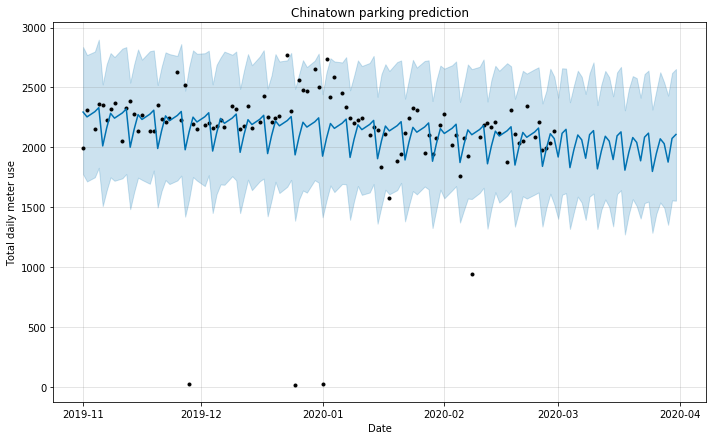

In [65]:
# run for chinatown p3
pred_output = run_ts('Chinatown',3)
final = data_cleaning_p3('Chinatown',pred_output)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


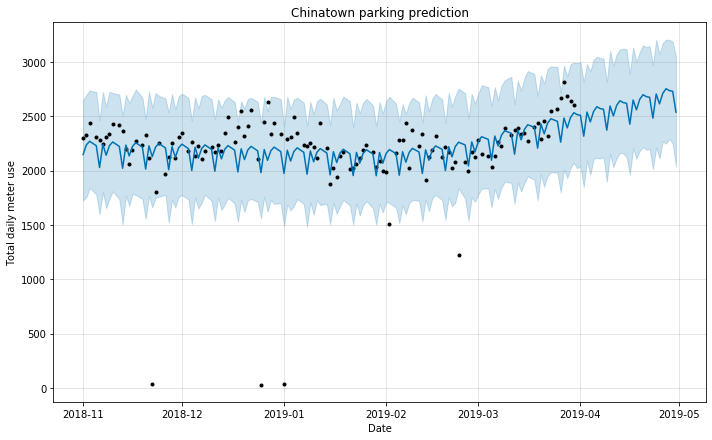

In [61]:
# run for Chinatown p2
pred_output = run_ts('Chinatown',2)
final = data_cleaning_p2('Chinatown',pred_output)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


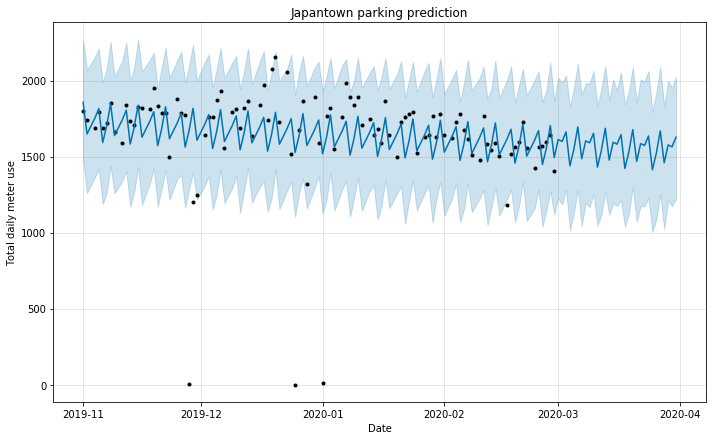

In [29]:
# run for Japantown p3
pred_output = run_ts('Japantown',3)
final = data_cleaning_p3('Japantown',pred_output)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


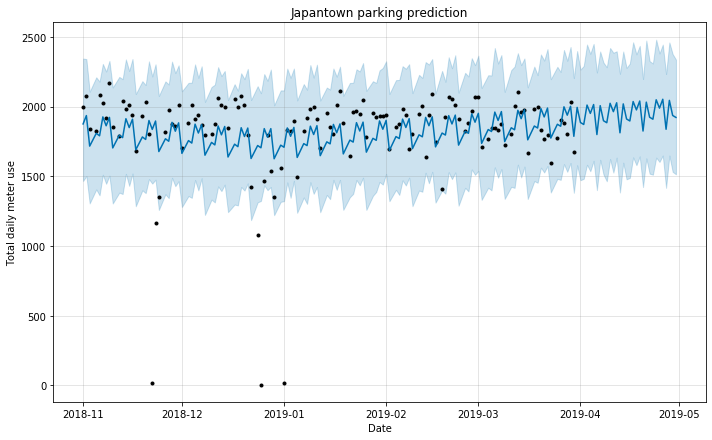

In [30]:
pred_output = run_ts('Japantown',2)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


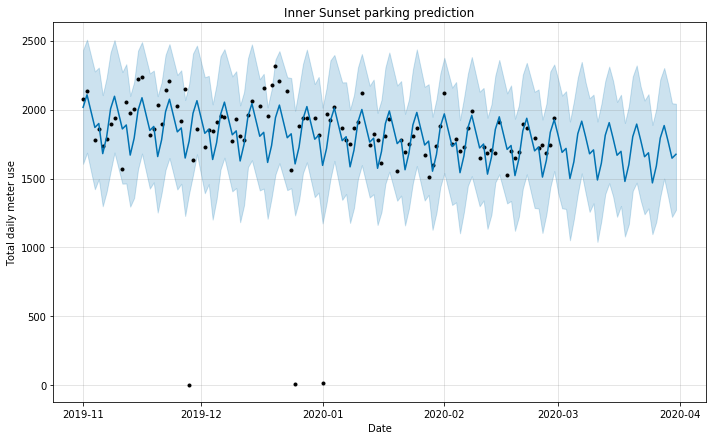

In [31]:
# run for inner sunset p3
pred_output = run_ts('Inner Sunset',3)
final = data_cleaning_p3('Inner Sunset',pred_output)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


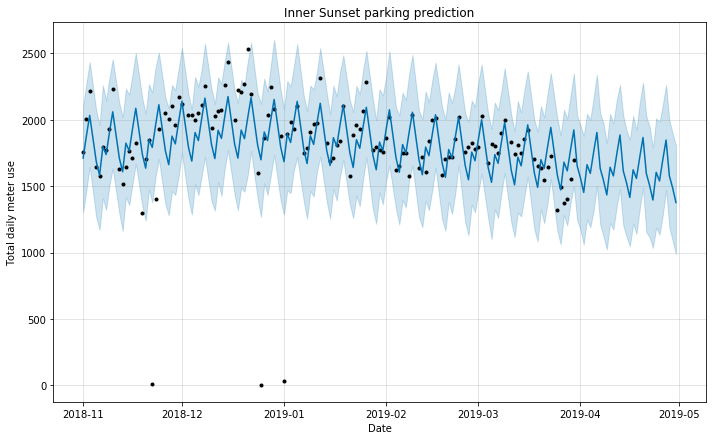

In [32]:
# run for inner sunset p2
pred_output = run_ts('Inner Sunset',2)

#### Operationalizing analysis for P3

In [68]:
# get neighborhood names 
neighborhoods = list(n_p3.nhood.unique())
neighborhoods.remove(np.nan)
# exclude Potrero Hill, Bayview, Nob Hill, Russian Hill, Mission bay, Tenderloin, FiDi, Portola from analysis with last year's data

Running for Bayview Hunters Point


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Bernal Heights


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Castro/Upper Market


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Chinatown


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Excelsior


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Financial District/South Beach


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Glen Park


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Golden Gate Park


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Haight Ashbury


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Hayes Valley


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Inner Richmond


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Inner Sunset


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Japantown


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Lakeshore


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Lone Mountain/USF


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Marina


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Mission


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Mission Bay


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Nob Hill


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Noe Valley


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for North Beach


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Oceanview/Merced/Ingleside


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Outer Mission


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Outer Richmond


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Pacific Heights


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Portola


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Potrero Hill


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Presidio Heights


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Russian Hill


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for South of Market


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Sunset/Parkside


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Tenderloin


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Visitacion Valley


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for West of Twin Peaks


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Western Addition


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


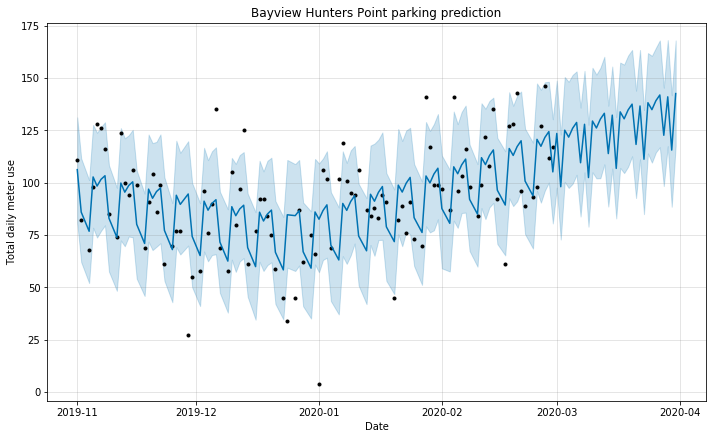

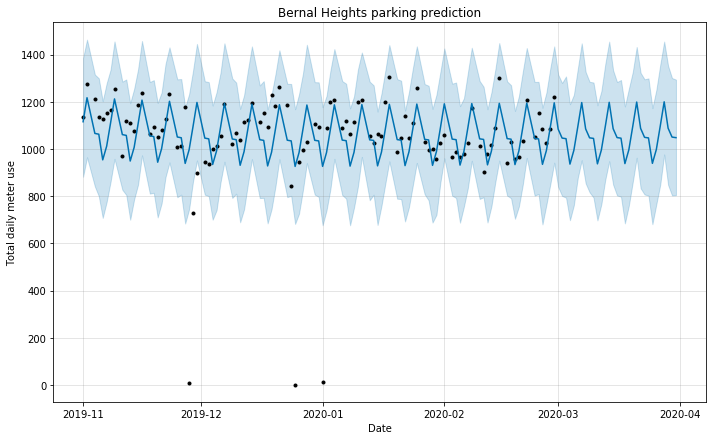

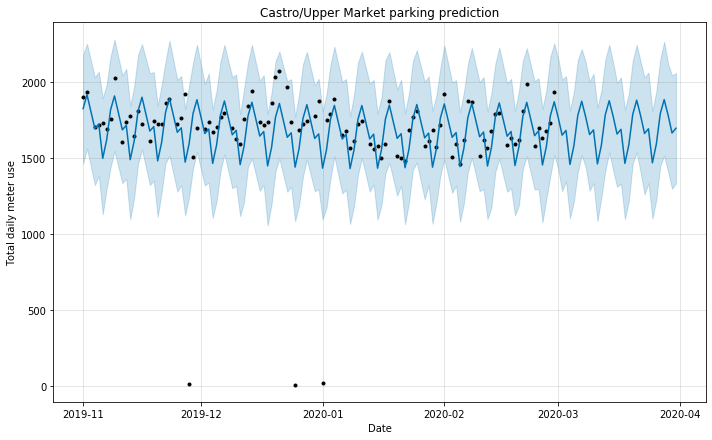

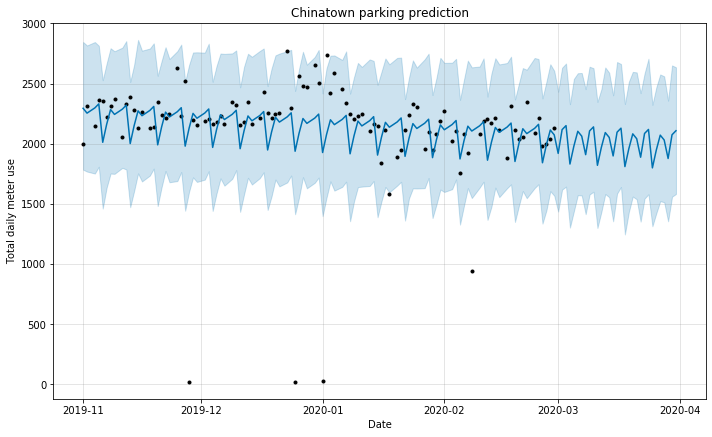

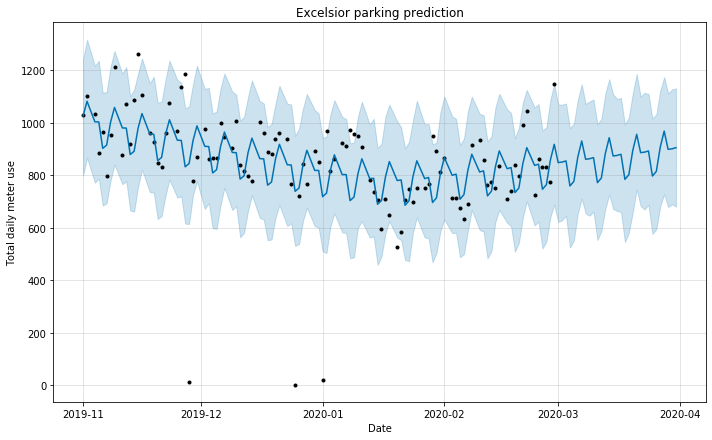

...

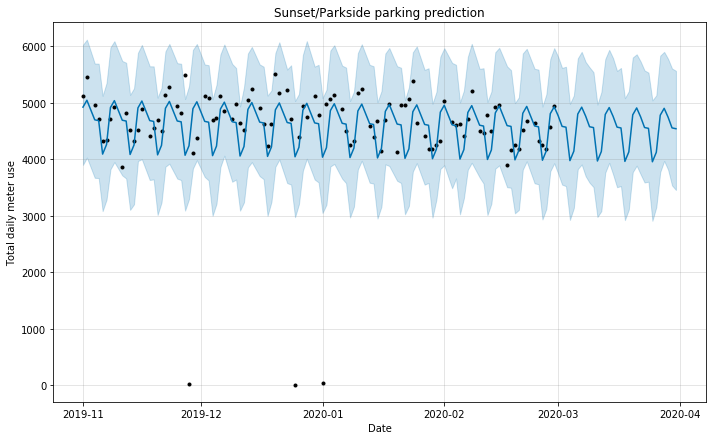

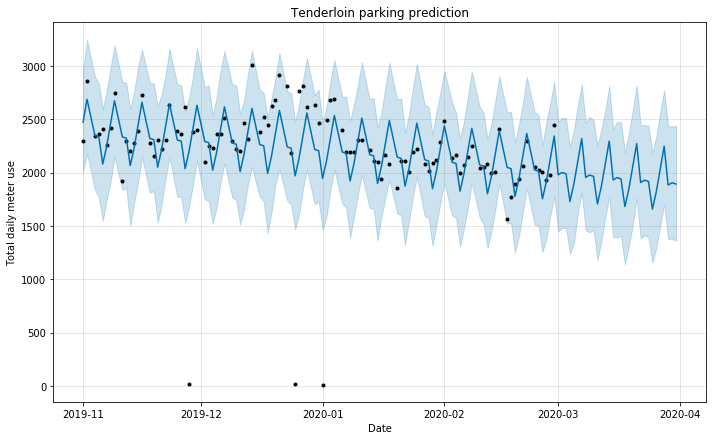

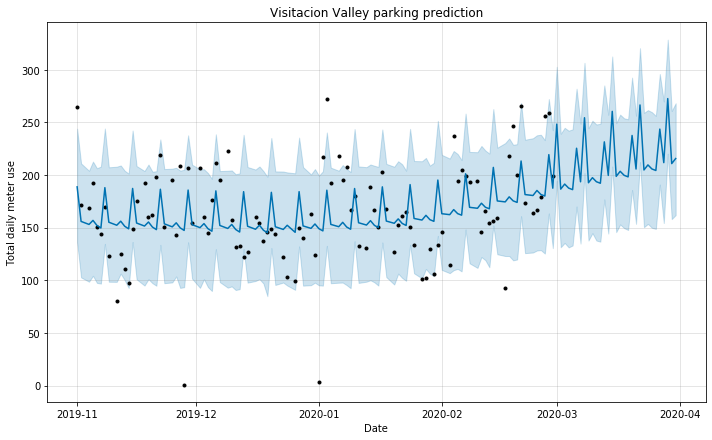

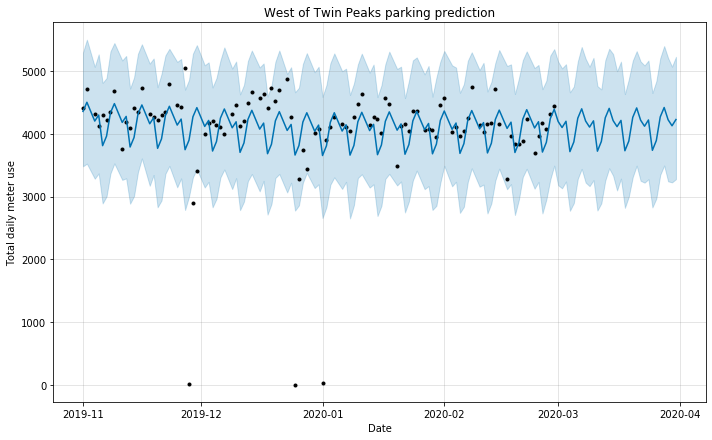

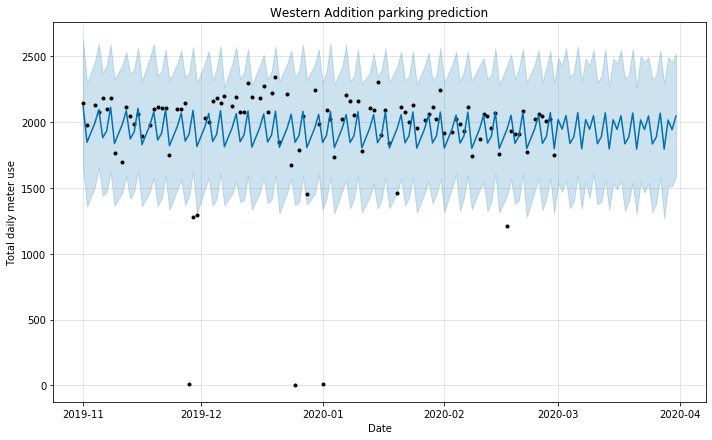

In [69]:
# initialize dataframe to save time series output 
cols = ['start_date_new', 'nhood', 'num_parking_meters', 'wday', 'date',
       'period', 'march', 'asian_nhood', 'month', 'avg_11_p3', 'avg_12_p3',
       'avg_1_p3', 'avg_2_p3', 'yhat_p3', 'trend_p3', 'yhat_lower',
       'yhat_upper']
final=pd.DataFrame(columns=cols)

# run for all neighborhoods for P3 
for n in neighborhoods:
    print('Running for',n)
    pred_output = run_ts(n,3)
    output = data_cleaning_p3(n,pred_output)
    final = final.append(output)

In [70]:
# final data
final.head()

,start_date_new,nhood,num_parking_meters,wday,date,period,march,asian_nhood,month,avg_11_p3,avg_12_p3,avg_1_p3,avg_2_p3,yhat_p3,trend_p3,yhat_lower,yhat_upper
0,2020-03-02,Bayview Hunters Point,108,2,2020-03-02,Nov19-Mar20,2020,0,3,89.08,77.72,89.148148,108.6,98.100940,117.747091,72.863459,123.028868
1,2020-03-03,Bayview Hunters Point,129,3,2020-03-03,Nov19-Mar20,2020,0,3,89.08,77.72,89.148148,108.6,125.111046,118.372135,100.420702,150.528241
2,2020-03-04,Bayview Hunters Point,105,4,2020-03-04,Nov19-Mar20,2020,0,3,89.08,77.72,89.148148,108.6,121.800277,118.997179,97.501653,148.214077
3,2020-03-05,Bayview Hunters Point,122,5,2020-03-05,Nov19-Mar20,2020,0,3,89.08,77.72,89.148148,108.6,126.043095,119.622223,99.501675,151.530505
4,2020-03-06,Bayview Hunters Point,138,6,2020-03-06,Nov19-Mar20,2020,0,3,89.08,77.72,89.148148,108.6,128.813703,120.247266,103.791732,153.209891


In [71]:
#evaluate difference between actual and expected
# actual - expected
final['delta_trend'] = final.num_parking_meters - final.trend_p3
final['delta_yhat'] = final.num_parking_meters - final.yhat_p3

# normalize
final['delta_trend_norm'] = final['delta_trend']/final['avg_11_p3'] # normalizing to average from Nov 2019, pre-COVID
final['delta_yhat_norm'] = final['delta_yhat']/final['avg_11_p3'] # normalizing to average from Nov 2019, pre-COVID

In [72]:
final.head()

,start_date_new,nhood,num_parking_meters,wday,date,period,march,asian_nhood,month,avg_11_p3,...,avg_1_p3,avg_2_p3,yhat_p3,trend_p3,yhat_lower,yhat_upper,delta_trend,delta_yhat,delta_trend_norm,delta_yhat_norm
0,2020-03-02,Bayview Hunters Point,108,2,2020-03-02,Nov19-Mar20,2020,0,3,89.08,...,89.148148,108.6,98.100940,117.747091,72.863459,123.028868,-9.74709,9.89906,-0.10942,0.111126
1,2020-03-03,Bayview Hunters Point,129,3,2020-03-03,Nov19-Mar20,2020,0,3,89.08,...,89.148148,108.6,125.111046,118.372135,100.420702,150.528241,10.6279,3.88895,0.119307,0.0436569
2,2020-03-04,Bayview Hunters Point,105,4,2020-03-04,Nov19-Mar20,2020,0,3,89.08,...,89.148148,108.6,121.800277,118.997179,97.501653,148.214077,-13.9972,-16.8003,-0.15713,-0.188598
3,2020-03-05,Bayview Hunters Point,122,5,2020-03-05,Nov19-Mar20,2020,0,3,89.08,...,89.148148,108.6,126.043095,119.622223,99.501675,151.530505,2.37778,-4.0431,0.0266926,-0.0453872
4,2020-03-06,Bayview Hunters Point,138,6,2020-03-06,Nov19-Mar20,2020,0,3,89.08,...,89.148148,108.6,128.813703,120.247266,103.791732,153.209891,17.7527,9.1863,0.19929,0.103124


INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


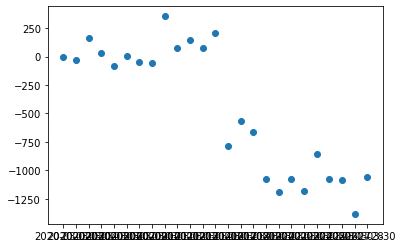

In [73]:
# Chinatown delta plot
plt.scatter(final[final['nhood']=='Chinatown'].start_date_new, final[final['nhood']=='Chinatown'].delta_yhat)

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


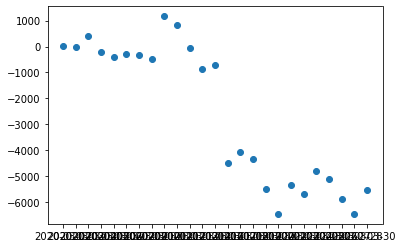

In [75]:
# Mission delta plot
plt.scatter(final[final['nhood']=='Mission'].start_date_new, final[final['nhood']=='Mission'].delta_yhat)

NameError: name 'final' is not defined

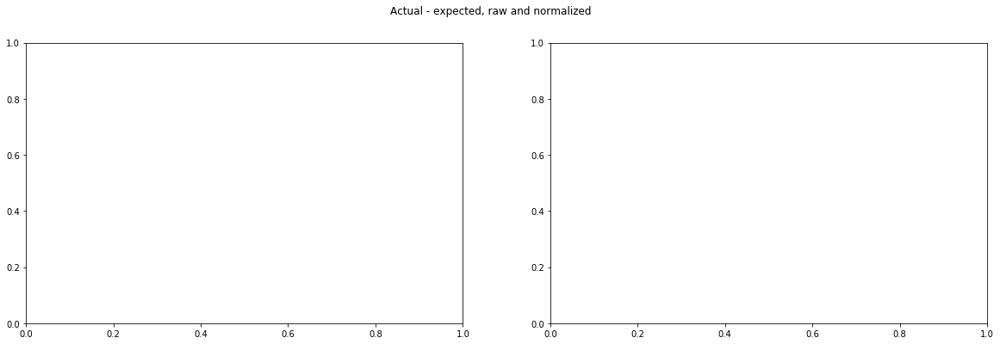

In [11]:
# looping through and visualizing in seaborn 
# sample code from https://medium.com/@rayheberer/generating-matplotlib-subplots-programmatically-cc234629b648

# comparing raw to norm delta_yhat
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,6))
fig.suptitle('Actual - expected, raw and normalized')
cols = ['delta_yhat','delta_yhat_norm']

chinatown_final = final[final['nhood']=='Chinatown']

for ax, feature, name in zip(axes.flatten(), chinatown_final[cols], cols):
    print(ax, feature, name)
    y = chinatown_final[name]
    x = chinatown_final.start_date_new
    sns.scatterplot(x,y,ax=ax)
    ax.set(title=name, xlabel='')

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


AxesSubplot(0.125,0.125;0.352273x0.755) delta_yhat_norm delta_yhat_norm
AxesSubplot(0.547727,0.125;0.352273x0.755) delta_trend_norm delta_trend_norm


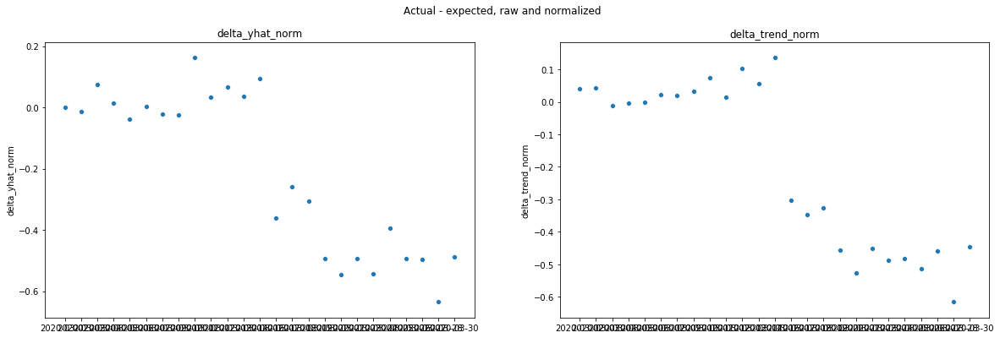

In [77]:
# comparing delta_yhat_norm to delta_trend_norm
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,6))
fig.suptitle('Actual - expected, raw and normalized')
cols = ['delta_yhat_norm','delta_trend_norm']

chinatown_final = final[final['nhood']=='Chinatown']

for ax, feature, name in zip(axes.flatten(), chinatown_final[cols], cols):
    print(ax, feature, name)
    y = chinatown_final[name]
    x = chinatown_final.start_date_new
    sns.scatterplot(x,y,ax=ax)
    ax.set(title=name, xlabel='')

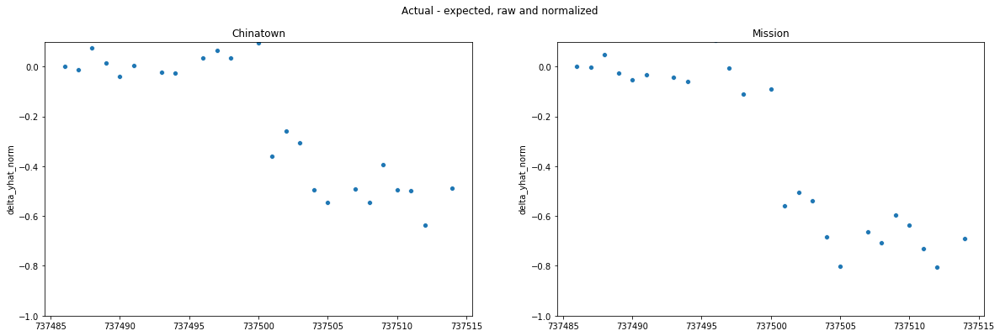

In [81]:
# showing norm Mission and norm Chinatown side by side
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,6))
fig.suptitle('Actual - expected, raw and normalized')
nhoods = ['Chinatown','Mission']

for ax, nhood in zip(axes.flatten(), nhoods):
    # set up data
    n_final = final[final['nhood']==nhood]
    y = n_final['delta_yhat_norm']
    x = plt_dt.date2num(n_final.date) # fixes the error above but now the dates are numbers. shrug

    # plot
    sns.scatterplot(x,y,ax=ax)
    
    # plot params
    ax.set(title=nhood, xlabel='')
    ax.set_ylim(-1,.1)

In [142]:
final.columns

Index(['start_date_new', 'nhood', 'num_parking_meters', 'wday', 'date',
       'period', 'march', 'asian_nhood', 'month', 'avg_feb', 'trend',
       'yhat_lower', 'yhat_upper', 'delta', 'delta_norm'],
      dtype='object')

In [149]:
# find the minimum difference for each neighborhood, plot in that order
min_df = final[['nhood','delta_norm']].groupby('nhood').min()
min_df.reset_index(inplace=True)
neighborhoods = min_df.sort_values(by='delta_norm').nhood

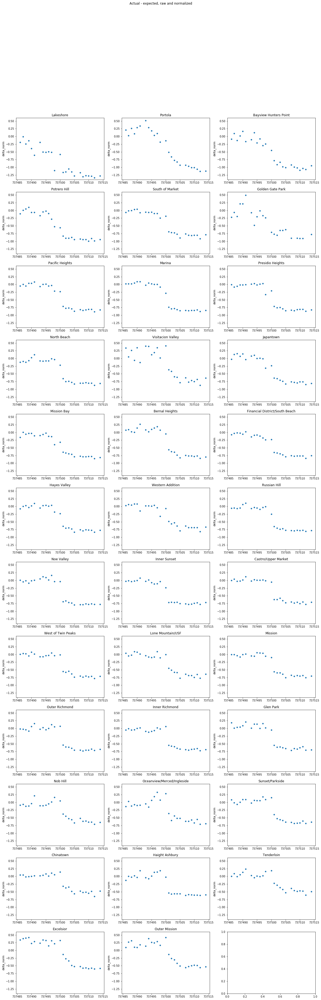

In [150]:
# plot all - march norm 
fig, axes = plt.subplots(nrows=12, ncols=3, figsize=(20,60))
fig.suptitle('Actual - expected, raw and normalized')
fig.subplots_adjust(hspace=0.2)

for ax, nhood in zip(axes.flatten(), neighborhoods):
    # set up data
    n_final = final[final['nhood']==nhood]
    y = n_final['delta_norm']
    x = plt_dt.date2num(n_final.date) # fixes the error above but now the dates are numbers. shrug

    # plot
    sns.scatterplot(x,y,ax=ax)
    
    # plot params
    ax.set(title=nhood, xlabel='')
    ax.set_ylim(-1.4,.6)

plt.savefig("time_series_graphs/delta_graphs.png".format(nhood.replace('/',' '))) # save as png

### Operationalizing analysis for P2 trend compared to P3 real life

In [10]:
# get neighborhood names 
neighborhoods = list(n_p3.nhood.unique())

# exclude Potrero Hill, Bayview, Nob Hill, Russian Hill, Mission bay, Tenderloin, FiDi, Portola from analysis
# number of marking meters changed by >5%
to_remove = [np.nan,'Potrero Hill', 'Bayview Hunters Point', 'Nob Hill', 'Russian Hill', 'Mission Bay', 'Tenderloin', 'Financial District/South Beach', 'Portola']
for x in to_remove:
    neighborhoods.remove(x)

Running for Bernal Heights


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Castro/Upper Market


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Chinatown


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Excelsior


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Glen Park


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Golden Gate Park


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Haight Ashbury


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Hayes Valley


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Inner Richmond


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Inner Sunset


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Japantown


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Lakeshore


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Lone Mountain/USF


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Marina


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Mission


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Noe Valley


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for North Beach


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Oceanview/Merced/Ingleside


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Outer Mission


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Outer Richmond


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Pacific Heights


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Presidio Heights


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for South of Market


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Sunset/Parkside


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Visitacion Valley


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for West of Twin Peaks


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Western Addition


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


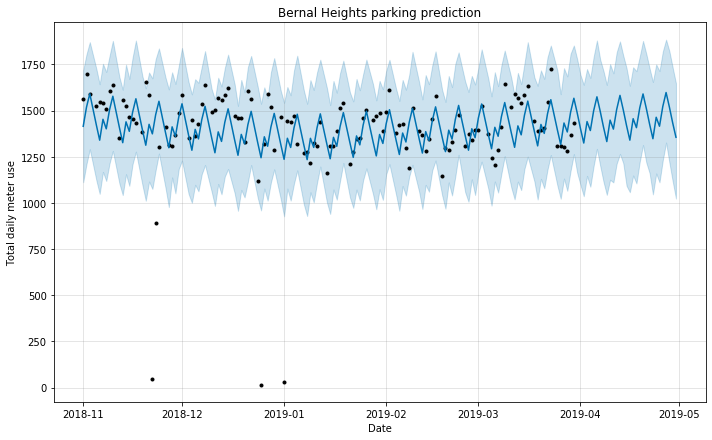

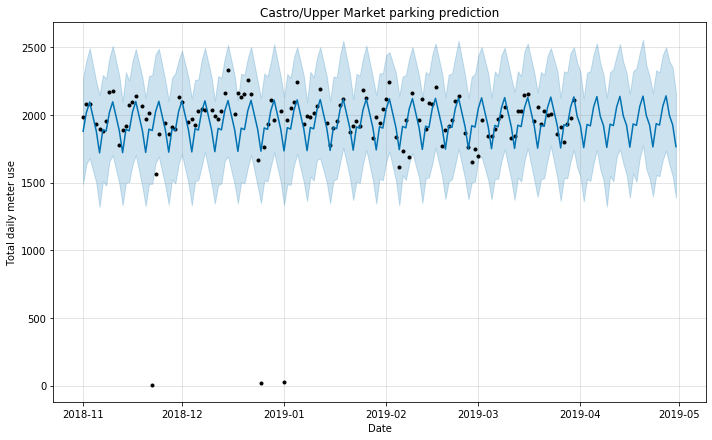

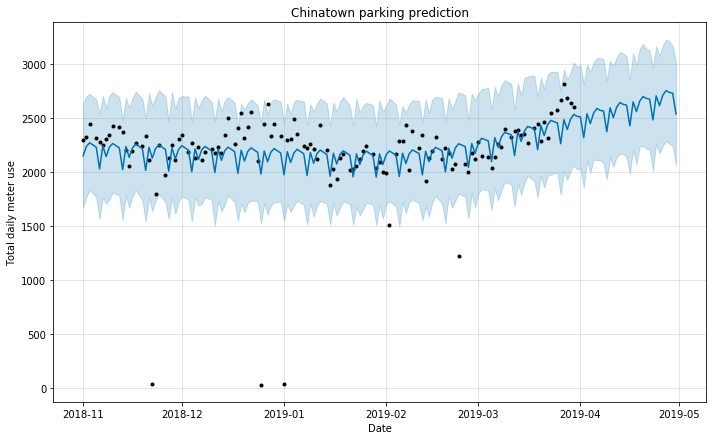

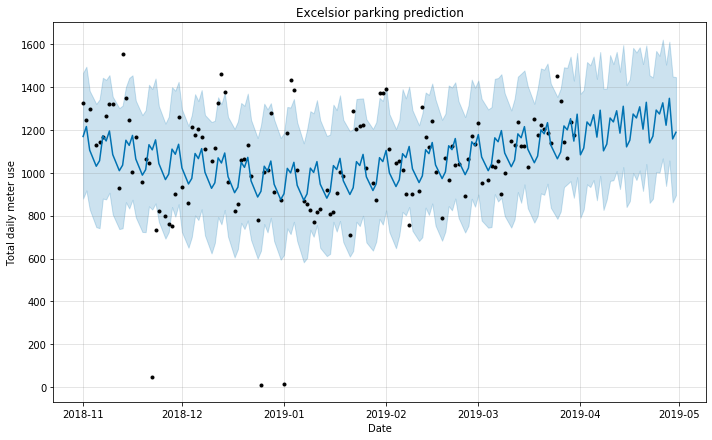

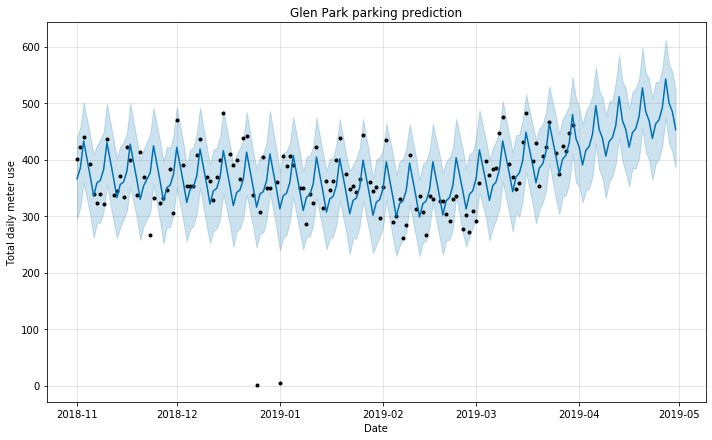

...

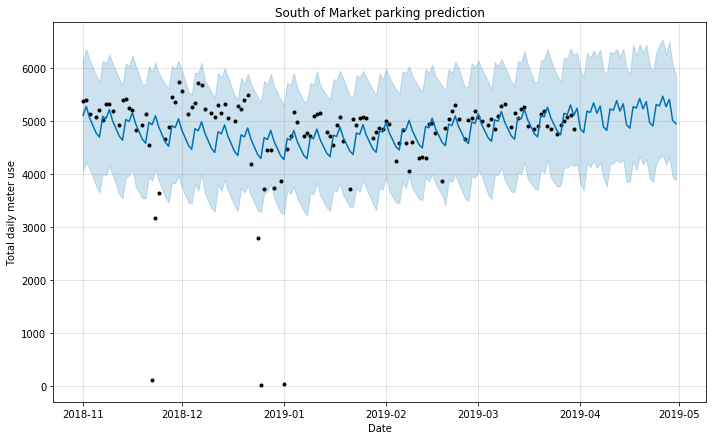

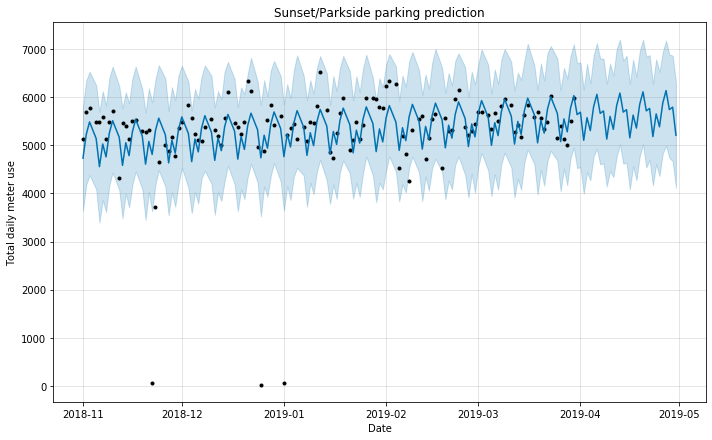

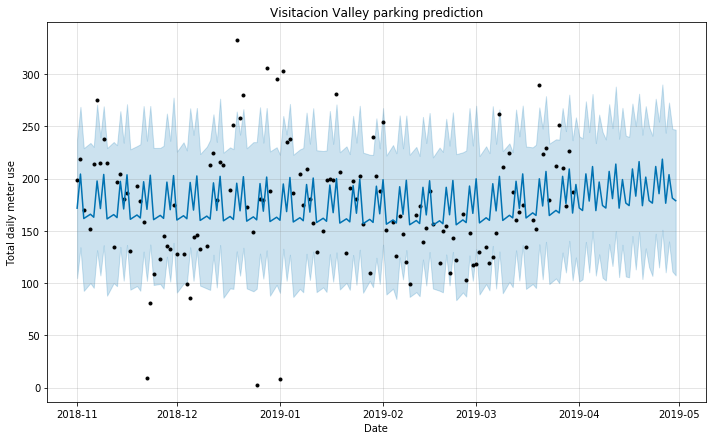

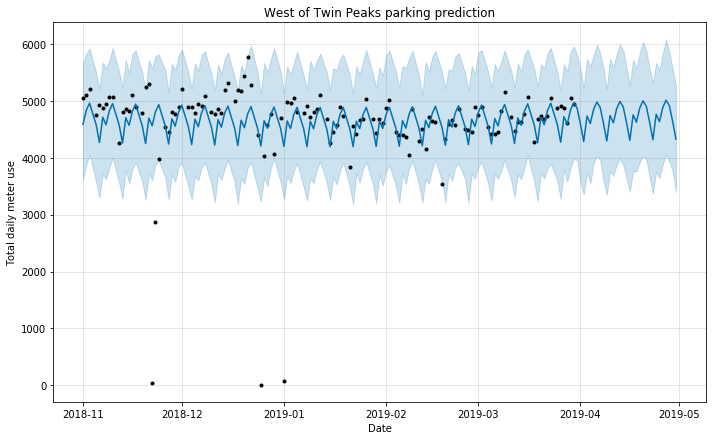

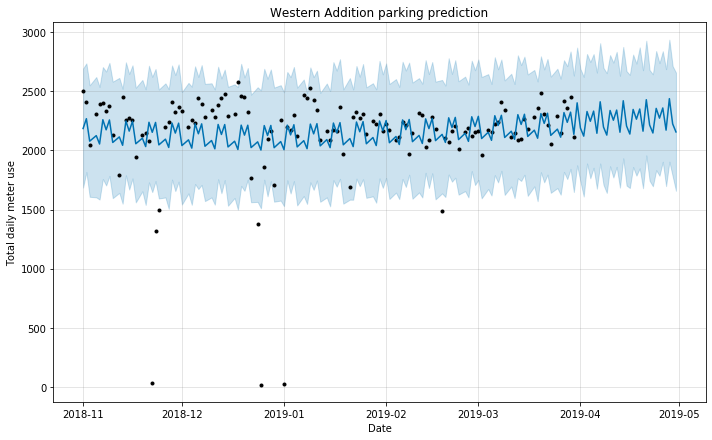

In [11]:
# initialize dataframe to save time series output 
cols = ['start_date_new', 'nhood', 'num_parking_meters', 'wday', 'date',
       'period', 'march', 'asian_nhood', 'month', 'avg_11_p3', 'avg_12_p3',
       'avg_1_p3', 'avg_2_p3', 'yhat_p2', 'trend_p2', 'yhat_lower',
       'yhat_upper']
final_p2=pd.DataFrame(columns=cols)

# run for all neighborhoods for P3 
for n in neighborhoods:
    print('Running for',n)
    pred_output = run_ts(n,2)
    output = data_cleaning_p2(n,pred_output)
    final_p2 = final_p2.append(output)

In [12]:
final_p2.head()

,start_date_new,nhood,num_parking_meters,wday,date,period,march,asian_nhood,month,avg_11_p3,avg_12_p3,avg_1_p3,avg_2_p3,yhat_p2,trend_p2,yhat_lower,yhat_upper
0,2020-03-02,Bernal Heights,1137,2,2020-03-02,Nov19-Mar20,2020,0,3,1063.038462,1035.653846,1059.703704,1048.48,1371.750453,1412.751861,1078.319010,1674.633072
1,2020-03-03,Bernal Heights,1150,3,2020-03-03,Nov19-Mar20,2020,0,3,1063.038462,1035.653846,1059.703704,1048.48,1293.407017,1413.861835,985.385590,1577.435872
2,2020-03-04,Bernal Heights,1083,4,2020-03-04,Nov19-Mar20,2020,0,3,1063.038462,1035.653846,1059.703704,1048.48,1409.633432,1414.971808,1116.094549,1707.882668
3,2020-03-05,Bernal Heights,1060,5,2020-03-05,Nov19-Mar20,2020,0,3,1063.038462,1035.653846,1059.703704,1048.48,1361.034974,1416.081782,1056.102309,1632.793962
4,2020-03-06,Bernal Heights,1204,6,2020-03-06,Nov19-Mar20,2020,0,3,1063.038462,1035.653846,1059.703704,1048.48,1467.893299,1417.191755,1158.654007,1746.014646


In [13]:
#evaluate difference between actual and expected
# actual - expected
final_p2['delta_trend'] = final_p2.num_parking_meters - final_p2.trend_p2
final_p2['delta_yhat'] = final_p2.num_parking_meters - final_p2.yhat_p2

# normalize
final_p2['delta_trend_norm'] = final_p2['delta_trend']/final_p2['avg_11_p3'] # normalizing to average from Nov 2019, pre-COVID
final_p2['delta_yhat_norm'] = final_p2['delta_yhat']/final_p2['avg_11_p3'] # normalizing to average from Nov 2019, pre-COVID

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


AxesSubplot(0.125,0.125;0.352273x0.755) delta_yhat_norm delta_yhat_norm
AxesSubplot(0.547727,0.125;0.352273x0.755) delta_trend_norm delta_trend_norm


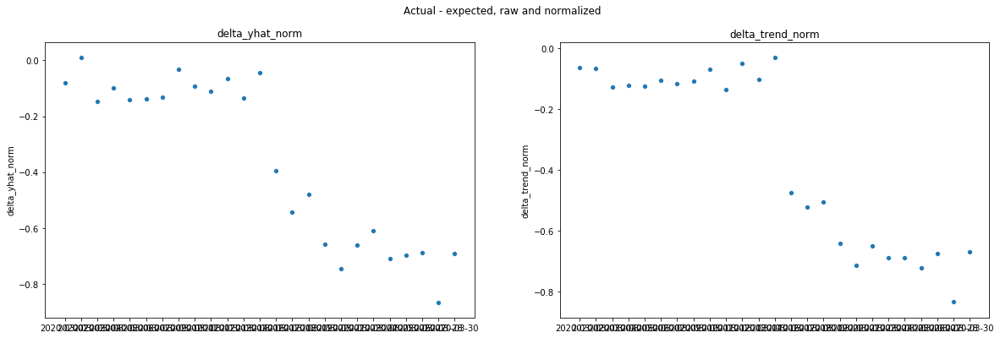

In [101]:
# comparing delta_yhat_norm to delta_trend_norm
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,6))
fig.suptitle('Actual - expected, raw and normalized')
cols = ['delta_yhat_norm','delta_trend_norm']

chinatown_final = final_p2[final_p2['nhood']=='Chinatown']

for ax, feature, name in zip(axes.flatten(), chinatown_final[cols], cols):
    print(ax, feature, name)
    y = chinatown_final[name]
    x = chinatown_final.start_date_new
    sns.scatterplot(x,y,ax=ax)
    ax.set(title=name, xlabel='')

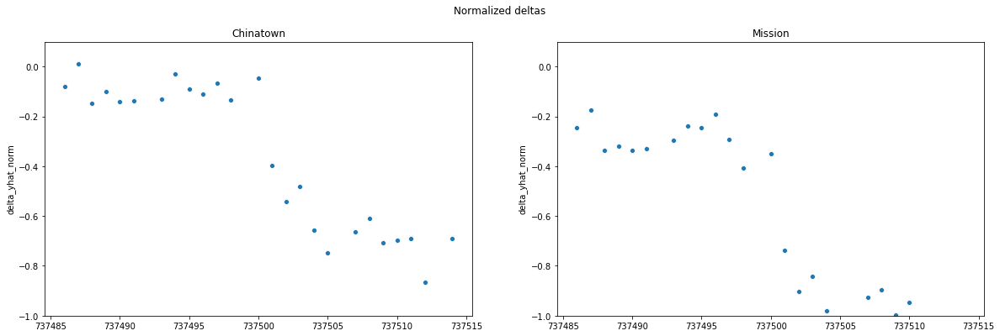

In [103]:
# showing norm Mission and norm Chinatown side by side
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,6))
fig.suptitle('Normalized deltas')
nhoods = ['Chinatown','Mission']

for ax, nhood in zip(axes.flatten(), nhoods):
    # set up data
    n_final = final_p2[final_p2['nhood']==nhood]
    y = n_final['delta_yhat_norm']
    x = plt_dt.date2num(n_final.date) # fixes the error above but now the dates are numbers. shrug

    # plot
    sns.scatterplot(x,y,ax=ax)
    
    # plot params
    ax.set(title=nhood, xlabel='')
    ax.set_ylim(-1,.1)

In [24]:
# find the minimum difference for each neighborhood, plot in that order
min_df = final_p2[['nhood','delta_trend_norm']].groupby('nhood').min()
min_df.reset_index(inplace=True)
neighborhoods = min_df.sort_values(by='delta_trend_norm').nhood
neighborhoods

11                     Lakeshore
0                 Bernal Heights
6                 Haight Ashbury
22               South of Market
20               Pacific Heights
17    Oceanview/Merced/Ingleside
16                   North Beach
14                       Mission
10                     Japantown
13                        Marina
21              Presidio Heights
26              Western Addition
18                 Outer Mission
1            Castro/Upper Market
19                Outer Richmond
15                    Noe Valley
4                      Glen Park
7                   Hayes Valley
23               Sunset/Parkside
8                 Inner Richmond
25            West of Twin Peaks
12             Lone Mountain/USF
5               Golden Gate Park
2                      Chinatown
3                      Excelsior
24             Visitacion Valley
9                   Inner Sunset
Name: nhood, dtype: object

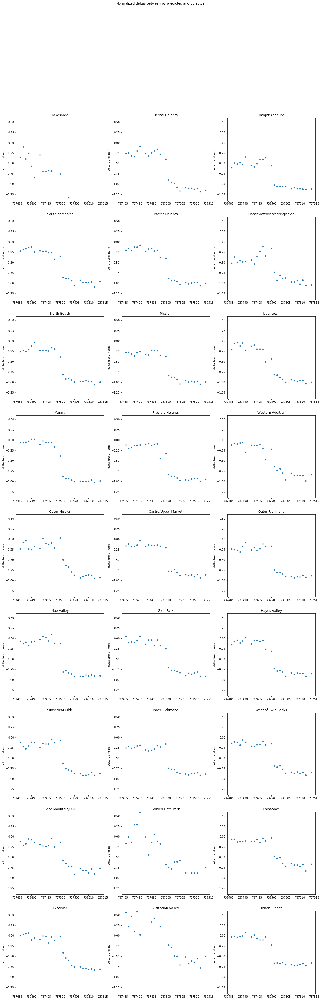

In [114]:
# plot all neighborhoods - yhat norm 
fig, axes = plt.subplots(nrows=9, ncols=3, figsize=(20,60))
fig.suptitle('Normalized deltas between p2 predicted and p3 actual')
fig.subplots_adjust(hspace=0.2)

for ax, nhood in zip(axes.flatten(), neighborhoods):
    # set up data
    n_final = final_p2[final_p2['nhood']==nhood]
    y = n_final['delta_trend_norm']
    x = plt_dt.date2num(n_final.date) # fixes the error above but now the dates are numbers. shrug

    # plot
    sns.scatterplot(x,y,ax=ax)
    
    # plot params
    ax.set(title=nhood, xlabel='')
    ax.set_ylim(-1.4,.6)

plt.savefig("time_series_graphs/delta_graphs_p2comp_trend.png".format(nhood.replace('/',' '))) # save as png

In [74]:
# just plot 6 interesting neighborhoods, with rank. SOMA, Mission, Marina
min_df = final_p2[['nhood','delta_trend_norm']].groupby('nhood').min()
min_df.reset_index(inplace=True)
min_df.sort_values(by='delta_trend_norm', inplace=True)
min_df.reset_index(inplace=True,drop=True)
min_df.reset_index(inplace=True)
min_df.rename(columns={'index': 'rank'}, inplace=True)
#min_df
drop_ind = [0,1,2,3,4,5,6,10,11,12,13,14,15,16,18,19,20,21,22,24,25]
nhood_viz = min_df.drop(drop_ind,0)
neighborhoods = nhood_viz.nhood

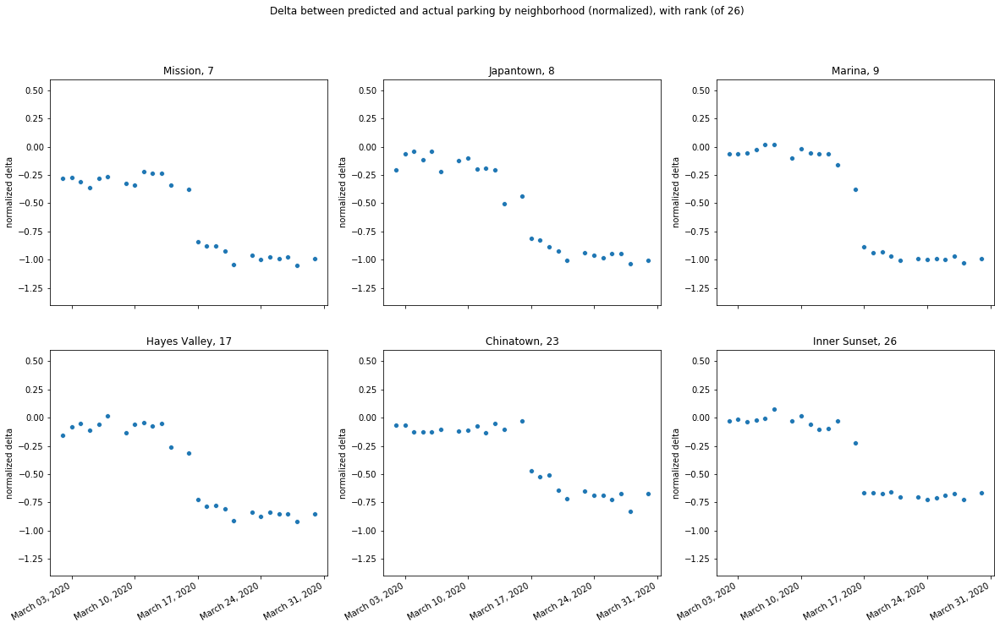

In [75]:
# plot all neighborhoods - yhat norm 
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20,12))
fig.suptitle('Delta between predicted and actual parking by neighborhood (normalized), with rank (of 26)')
fig.subplots_adjust(hspace=0.2)

for ax, nhood in zip(axes.flatten(), neighborhoods):
    # set up data
    n_final = final_p2[final_p2['nhood']==nhood]
    rank = str(nhood_viz[nhood_viz['nhood']==nhood].index.values.astype(int)[0])
    y = n_final['delta_trend_norm']
    x = plt_dt.date2num(n_final.date) # fixes the error above but now the dates are numbers. shrug

    # plot
    sns.scatterplot(x,y,ax=ax)
    
    # plot params
    ax.set(title=nhood+', '+rank, xlabel='', ylabel='normalized delta')
    ax.set_ylim(-1.4,.6)
    
    # format date ticks
    weeks = plt_dt.WeekdayLocator()
    week_fmt = plt_dt.DateFormatter('%B %d, %Y')
    ax.xaxis.set_major_locator(weeks)
    ax.xaxis.set_major_formatter(week_fmt)

fig.autofmt_xdate()
plt.savefig("time_series_graphs/delta_graphs_p2comp_trend.png".format(nhood.replace('/',' '))) # save as png

In [76]:
nhood_viz

,rank,nhood,delta_trend_norm
7,7,Mission,-1.047368
8,8,Japantown,-1.036624
9,9,Marina,-1.028727
17,17,Hayes Valley,-0.918096
23,23,Chinatown,-0.833782
26,26,Inner Sunset,-0.725279


In [86]:
drop_ind = [7,9,17]
asian_nhood_viz = nhood_viz.drop(drop_ind,0)
asian_nhoods = asian_nhood_viz.nhood
drop_ind = [8,23,26]
other_nhood_viz = nhood_viz.drop(drop_ind,0)
other_nhoods = other_nhood_viz.nhood

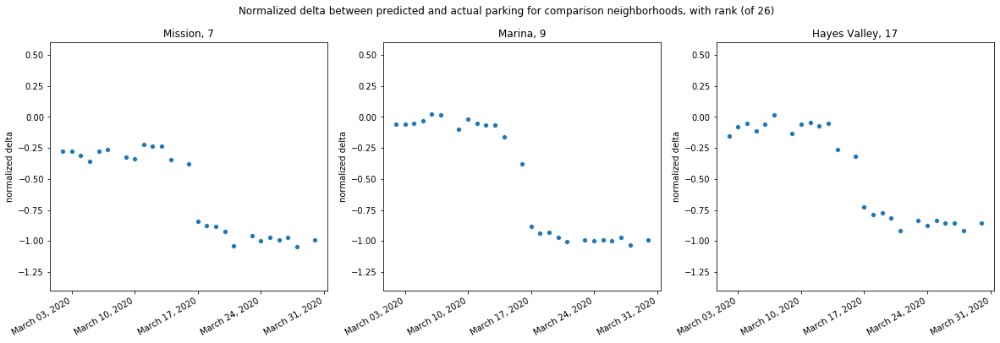

In [84]:
# plot all neighborhoods - yhat norm 
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,6))
fig.suptitle('Normalized delta between predicted and actual parking for comparison neighborhoods, with rank (of 26)')
fig.subplots_adjust(hspace=0.2)

for ax, nhood in zip(axes.flatten(), other_nhoods):
    # set up data
    n_final = final_p2[final_p2['nhood']==nhood]
    rank = str(other_nhood_viz[other_nhood_viz['nhood']==nhood].index.values.astype(int)[0])
    y = n_final['delta_trend_norm']
    x = plt_dt.date2num(n_final.date) # fixes the error above but now the dates are numbers. shrug

    # plot
    sns.scatterplot(x,y,ax=ax)
    
    # plot params
    ax.set(title=nhood+', '+rank, xlabel='', ylabel='normalized delta')
    ax.set_ylim(-1.4,.6)
    
    # format date ticks
    weeks = plt_dt.WeekdayLocator()
    week_fmt = plt_dt.DateFormatter('%B %d, %Y')
    ax.xaxis.set_major_locator(weeks)
    ax.xaxis.set_major_formatter(week_fmt)

fig.autofmt_xdate()

In [87]:
asian_nhoods

8        Japantown
23       Chinatown
26    Inner Sunset
Name: nhood, dtype: object

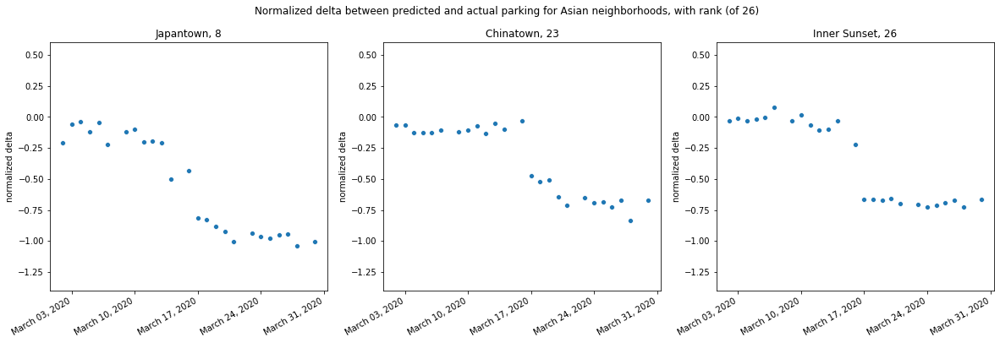

In [88]:
# plot all neighborhoods - yhat norm 
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,6))
fig.suptitle('Normalized delta between predicted and actual parking for Asian neighborhoods, with rank (of 26)')
fig.subplots_adjust(hspace=0.2)

for ax, nhood in zip(axes.flatten(), asian_nhoods):
    # set up data
    n_final = final_p2[final_p2['nhood']==nhood]
    rank = str(asian_nhood_viz[asian_nhood_viz['nhood']==nhood].index.values.astype(int)[0])
    y = n_final['delta_trend_norm']
    x = plt_dt.date2num(n_final.date) # fixes the error above but now the dates are numbers. shrug

    # plot
    sns.scatterplot(x,y,ax=ax)
    
    # plot params
    ax.set(title=nhood+', '+rank, xlabel='', ylabel='normalized delta')
    ax.set_ylim(-1.4,.6)
    
    # format date ticks
    weeks = plt_dt.WeekdayLocator()
    week_fmt = plt_dt.DateFormatter('%B %d, %Y')
    ax.xaxis.set_major_locator(weeks)
    ax.xaxis.set_major_formatter(week_fmt)

fig.autofmt_xdate()

## Running for 2019 data, predict 2020

In [4]:
# define function to create a new column with the mean for Feb
def mean_from_month(dataframe,month_num):
    dataframe['month']=dataframe.apply(lambda row: row['date'].month, axis=1) # get months
    df_mon=dataframe[dataframe['month']==month_num] # df limited to feb
    avg=df_mon.num_parking_meters.mean() # find average parking meter use in feb
    dataframe['avg_{}'.format(str(month_num))]=avg # save to the whole df
    return dataframe

def define_base_data(nhood):
    nhood_data = nbhd1920[nbhd1920['nhood']==nhood] # define neighborhood specific data 
    nhood_data = mean_from_month(nhood_data,11) # define new column with average from nov 2019
    nhood_data = mean_from_month(nhood_data,12) # define new column with average from dec 2019
    
    return nhood_data

# writing a function so we can repeat this for many neighborhoods
# this returns a df of predictions
def run_ts_2019(nhood):
    base_data = define_base_data(nhood)

    # define dataframe for prophet
    nhood_ts = base_data.rename(columns={'date': 'ds', 'num_parking_meters': 'y'}) # rename columns to Prophet's req
    nhood_ts = nhood_ts[nhood_ts['ds']<datetime.datetime(2020,1,1)] # limit to 2019 

    # Make the prophet model and fit on the data
    prophet = p(changepoint_prior_scale=0.20)
    prophet.fit(nhood_ts)

    # create prediction dataframe 
    forecast = prophet.make_future_dataframe(periods=91, freq='D') # predict first 3 months of 2019
    # make predictions
    pred = prophet.predict(forecast)

    # check with a plot 
    prophet.plot(pred, xlabel = 'Date', ylabel = 'Total daily meter use')
    plt.title('{} parking prediction'.format(nhood));
    plt.savefig("time_series_graphs/{}_2019_ts.png".format(nhood.replace('/',' '))) # save as png

    return pred

def data_cleaning_2020(nhood,pred):
    # define dataset
    nhood_data = define_base_data(nhood)

    # comparing to what actually happened
    pred_small = pred[['ds','yhat','trend','yhat_lower','yhat_upper']] # only save columns you want from predict df
    pred_2020 = pred_small[pred_small['ds']>=datetime.datetime(2020,1,1)] # restrict to 2020
    pred_2020= pred_2020[pred_2020['ds']<datetime.datetime(2020,3,31)] # drop March 31
    pred_2020['day_of_week'] = pred_2020.ds.dt.day_name() # find day of week 
    pred_2020=pred_2020[pred_2020['day_of_week']!='Sunday'] # drop sundays
    pred_2020.reset_index(inplace=True,drop=True)

    nhood_2020 = nhood_data[nhood_data['date']>=datetime.datetime(2020,1,1)] # restrict to 2020
    nhood_2020.reset_index(drop=True, inplace=True) # reset index

    final = pd.concat([nhood_2020, pred_2020], axis=1, sort=False)
    final.drop('ds', axis=1, inplace=True) # drop extra date column

    return final

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


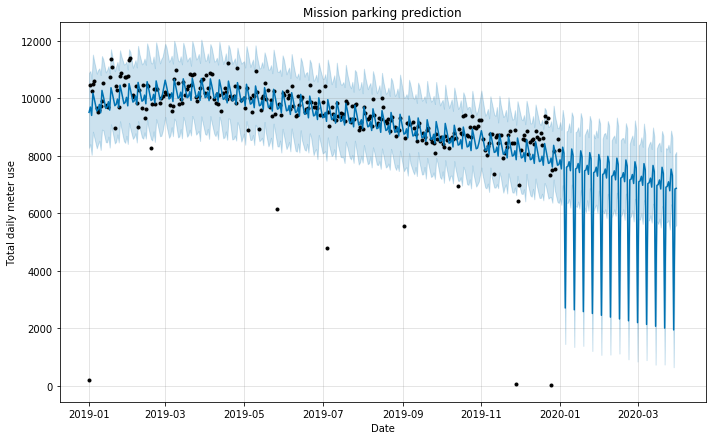

In [5]:
# try for Mission
pred = run_ts_2019('Mission')
final = data_cleaning_2020('Mission', pred)

In [6]:
# get neighborhood names 
neighborhoods = list(nbhd1920.nhood.unique())

# exclude Potrero Hill, Bayview, Nob Hill, Russian Hill, Mission bay, Tenderloin, FiDi, Portola from analysis
# number of marking meters changed by >5%
to_remove = [np.nan,'Potrero Hill', 'Bayview Hunters Point', 'Nob Hill', 'Russian Hill', 'Mission Bay', 'Tenderloin', 'Financial District/South Beach', 'Portola']
for x in to_remove:
    neighborhoods.remove(x)

In [7]:
final.columns

Index(['start_date_new', 'nhood', 'num_parking_meters', 'wday', 'date',
       'month', 'avg_11', 'avg_12', 'yhat', 'trend', 'yhat_lower',
       'yhat_upper', 'day_of_week'],
      dtype='object')

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Bernal Heights
Running for Castro/Upper Market


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Chinatown
Running for Excelsior


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Glen Park


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Golden Gate Park


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Haight Ashbury
Running for Hayes Valley


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Inner Richmond


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Inner Sunset


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Japantown


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Lakeshore
Running for Lone Mountain/USF


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Marina


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Mission


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Noe Valley


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for North Beach


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Oceanview/Merced/Ingleside


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Outer Mission


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Outer Richmond
Running for Pacific Heights


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Presidio Heights


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for South of Market
Running for Sunset/Parkside


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Visitacion Valley


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for West of Twin Peaks


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Running for Western Addition


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


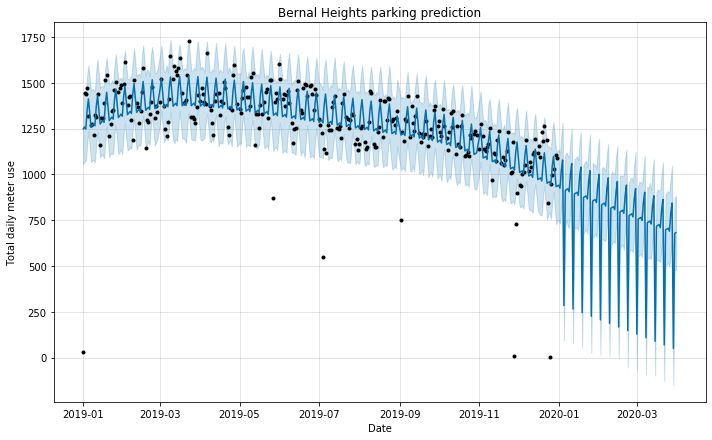

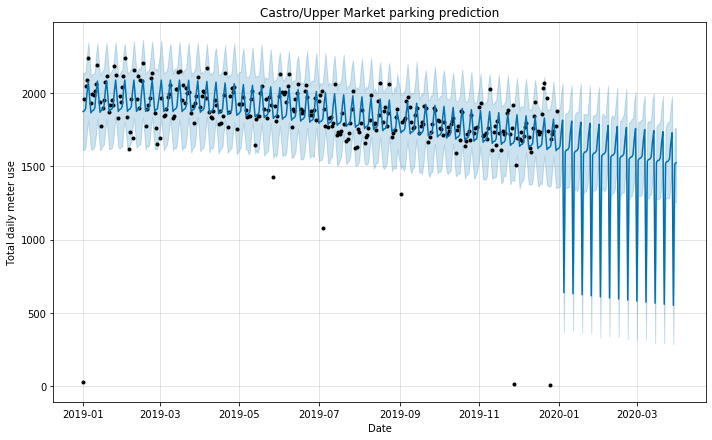

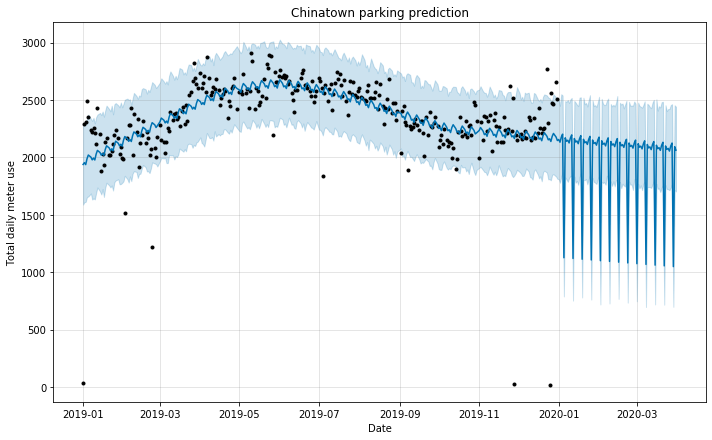

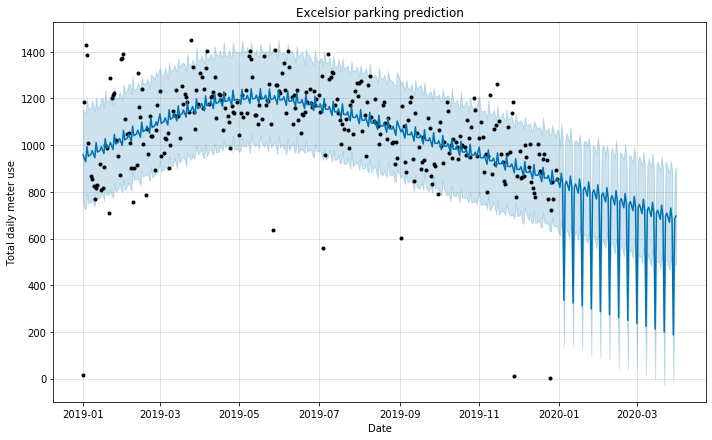

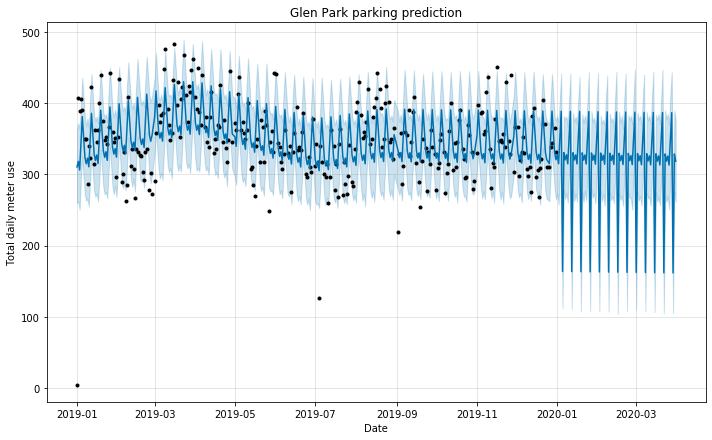

...

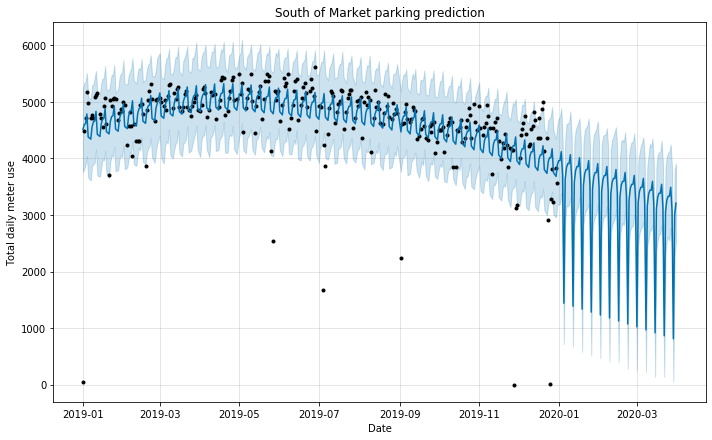

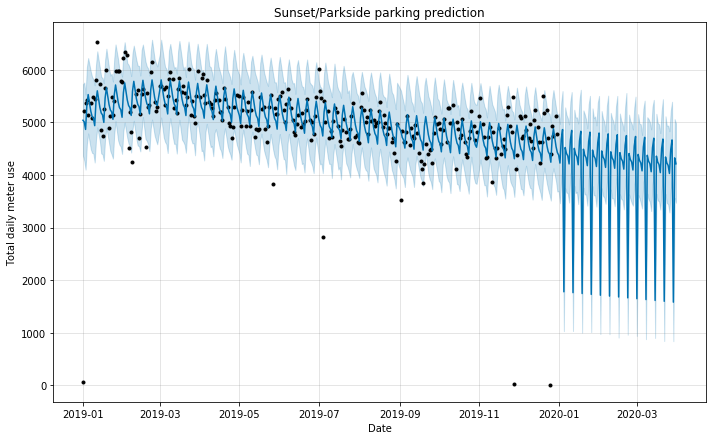

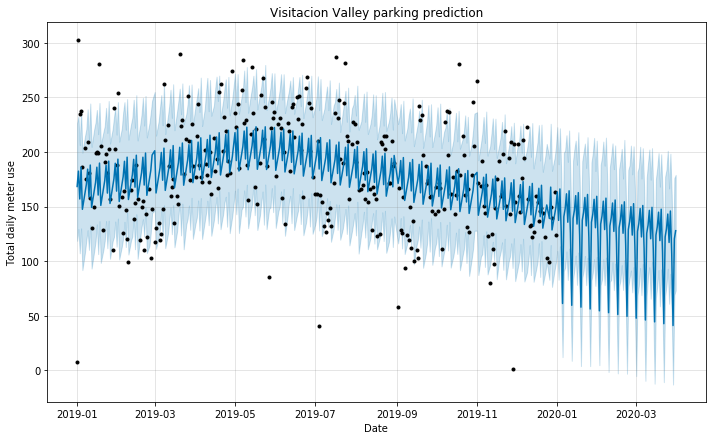

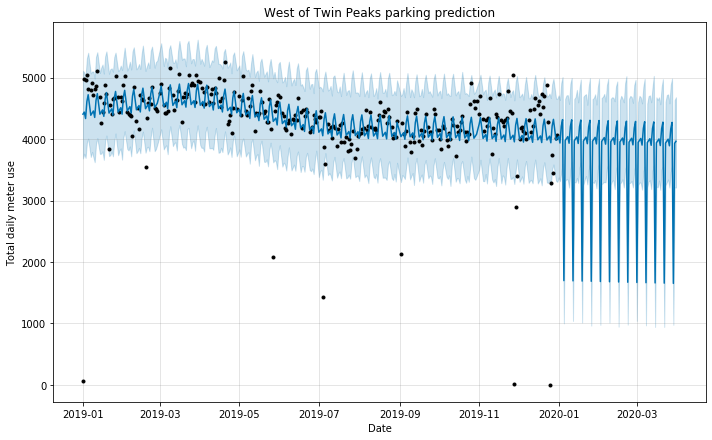

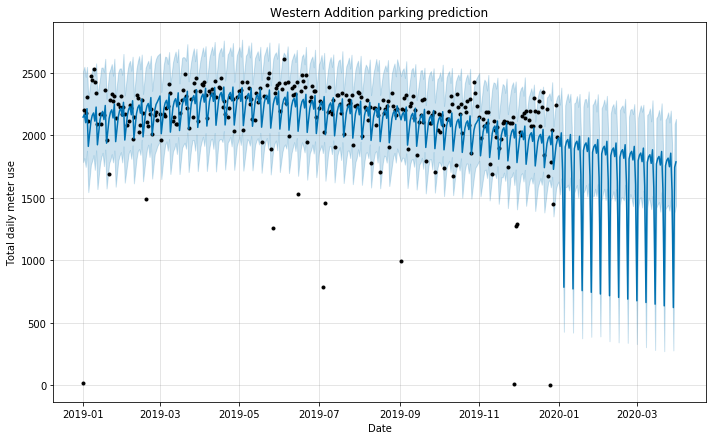

In [10]:
# initialize dataframe to save time series output 
cols = ['start_date_new', 'nhood', 'num_parking_meters', 'wday', 'date',
       'month', 'avg_11', 'avg_12', 'yhat', 'trend', 'yhat_lower',
       'yhat_upper', 'day_of_week']
final=pd.DataFrame(columns=cols)

# run for all neighborhoods for 2019-2020
for n in neighborhoods:
    print('Running for',n)
    pred_output = run_ts_2019(n)
    output = data_cleaning_2020(n,pred_output)
    final = final.append(output)

In [11]:
final.head()

,start_date_new,nhood,num_parking_meters,wday,date,month,avg_11,avg_12,yhat,trend,yhat_lower,yhat_upper,day_of_week
0,2020-01-01,Bernal Heights,13,4,2020-01-01,1,1063.038462,1035.653846,941.335831,877.343088,745.408395,1137.292107,Wednesday
1,2020-01-02,Bernal Heights,1088,5,2020-01-02,1,1063.038462,1035.653846,924.846626,874.545472,731.260399,1109.971096,Thursday
2,2020-01-03,Bernal Heights,1201,6,2020-01-03,1,1063.038462,1035.653846,1023.161604,871.747856,827.561720,1217.204421,Friday
3,2020-01-04,Bernal Heights,1207,7,2020-01-04,1,1063.038462,1035.653846,1078.919057,868.950240,885.996165,1281.543386,Saturday
4,2020-01-06,Bernal Heights,1088,2,2020-01-06,1,1063.038462,1035.653846,913.029421,863.355008,713.015507,1109.683453,Monday


In [12]:
#evaluate difference between actual and expected
# actual - expected
final['delta_trend'] = final.num_parking_meters - final.trend
final['delta_yhat'] = final.num_parking_meters - final.yhat

# normalize
final['delta_trend_norm'] = final['delta_trend']/final['avg_11'] # normalizing to average from Nov 2019, pre-COVID
final['delta_yhat_norm'] = final['delta_yhat']/final['avg_11'] # normalizing to average from Nov 2019, pre-COVID

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


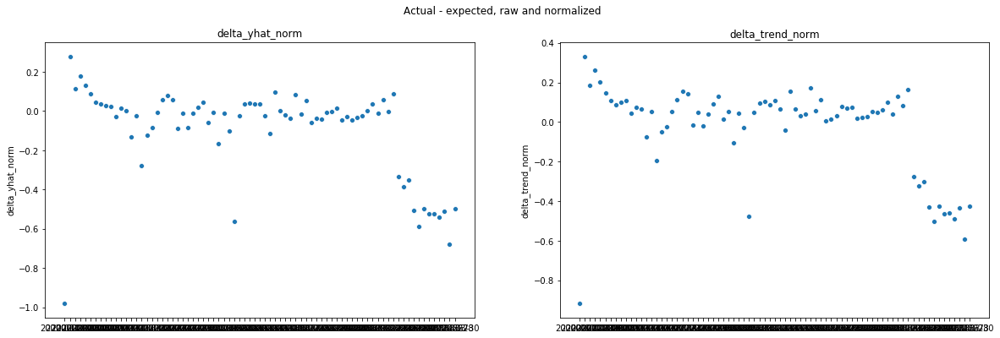

In [13]:
# comparing delta_yhat_norm to delta_trend_norm
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,6))
fig.suptitle('Actual - expected, raw and normalized')
cols = ['delta_yhat_norm','delta_trend_norm']

chinatown_final = final[final['nhood']=='Chinatown']

for ax, feature, name in zip(axes.flatten(), chinatown_final[cols], cols):
    y = chinatown_final[name]
    x = chinatown_final.start_date_new
    sns.scatterplot(x,y,ax=ax)
    ax.set(title=name, xlabel='')

In [14]:
# find the minimum difference for each neighborhood, plot in that order
final = final[final['date']!='2020-01-01'] # drop new years day first 
final=final[final['nhood']!='Lakeshore'] # drop Lakeshore and Golden Gate because they're all over the place
final=final[final['nhood']!='Golden Gate Park']
min_df = final[['nhood','delta_yhat_norm']].groupby('nhood').min() # find lowest day
min_df.reset_index(inplace=True) 
min_df.sort_values(by='delta_yhat_norm', inplace=True)
min_df.reset_index(inplace=True,drop=True)
min_df.reset_index(inplace=True)
min_df['rank']=min_df['index']+1
neighborhoods = min_df.nhood
neighborhoods

0                 Haight Ashbury
1                    North Beach
2                   Inner Sunset
3                   Hayes Valley
4                         Marina
5                Pacific Heights
6                      Glen Park
7             West of Twin Peaks
8                 Outer Richmond
9            Castro/Upper Market
10             Lone Mountain/USF
11              Presidio Heights
12                    Noe Valley
13                Inner Richmond
14                     Japantown
15               Sunset/Parkside
16    Oceanview/Merced/Ingleside
17                     Chinatown
18                       Mission
19              Western Addition
20                Bernal Heights
21               South of Market
22                 Outer Mission
23             Visitacion Valley
24                     Excelsior
Name: nhood, dtype: object

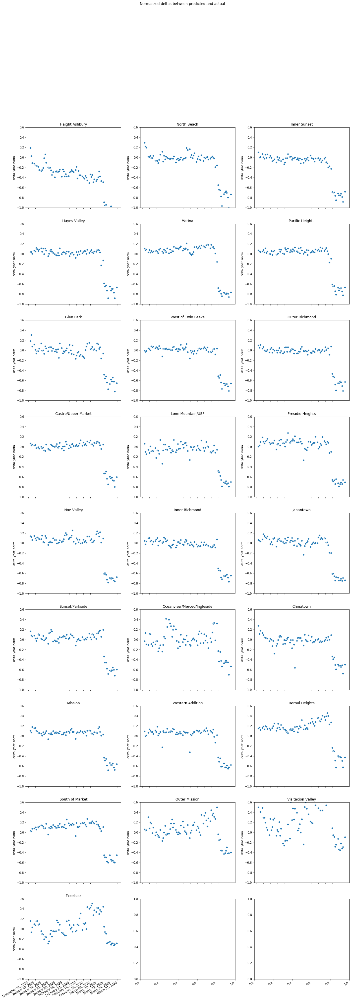

In [16]:
# plot all neighborhoods - yhat norm 
fig, axes = plt.subplots(nrows=9, ncols=3, figsize=(20,60))
fig.suptitle('Normalized deltas between predicted and actual')
fig.subplots_adjust(hspace=0.2)

for ax, nhood in zip(axes.flatten(), neighborhoods):
    # set up data
    n_final = final[final['nhood']==nhood]
    y = n_final['delta_yhat_norm']
    x = plt_dt.date2num(n_final.date) # fixes the error above but now the dates are numbers. shrug

    # plot
    sns.scatterplot(x,y,ax=ax)
    
    # plot params
    ax.set(title=nhood, xlabel='')
    ax.set_ylim(-1,.6)
    
    # format date ticks
    weeks = plt_dt.WeekdayLocator()
    week_fmt = plt_dt.DateFormatter('%B %d, %Y')
    ax.xaxis.set_major_locator(weeks)
    ax.xaxis.set_major_formatter(week_fmt)

fig.autofmt_xdate()

plt.savefig("time_series_graphs/delta_graphs_2020_yhat.png".format(nhood.replace('/',' '))) # save as png

In [162]:
min_df

,index,nhood,delta_yhat_norm,rank
0,0,Haight Ashbury,-1.257026,1
1,1,North Beach,-1.007094,2
2,2,Inner Sunset,-0.880721,3
3,3,Hayes Valley,-0.879215,4
4,4,Marina,-0.856739,5
5,5,Pacific Heights,-0.821443,6
6,6,Glen Park,-0.817892,7
7,7,West of Twin Peaks,-0.809919,8
8,8,Outer Richmond,-0.809138,9
9,9,Castro/Upper Market,-0.798458,10


In [19]:
# just plot 6 interesting neighborhoods, with rank. SOMA, Mission, Marina
drop_ind = [0,1,5,6,7,8,9,10,11,12,13,15,16,19,20,21,22,23,24]
nhood_viz = min_df.drop(drop_ind,0)
neighborhoods = nhood_viz.nhood

In [20]:
nhood_viz

,index,nhood,delta_yhat_norm,rank
2,2,Inner Sunset,-0.880721,3
3,3,Hayes Valley,-0.879215,4
4,4,Marina,-0.856739,5
14,14,Japantown,-0.751564,15
17,17,Chinatown,-0.678611,18
18,18,Mission,-0.678443,19


In [21]:
drop_ind = [3,4,18]
asian_nhood_viz = nhood_viz.drop(drop_ind,0)
asian_nhoods = asian_nhood_viz.nhood
drop_ind = [2,14,17]
other_nhood_viz = nhood_viz.drop(drop_ind,0)
other_nhoods = other_nhood_viz.nhood

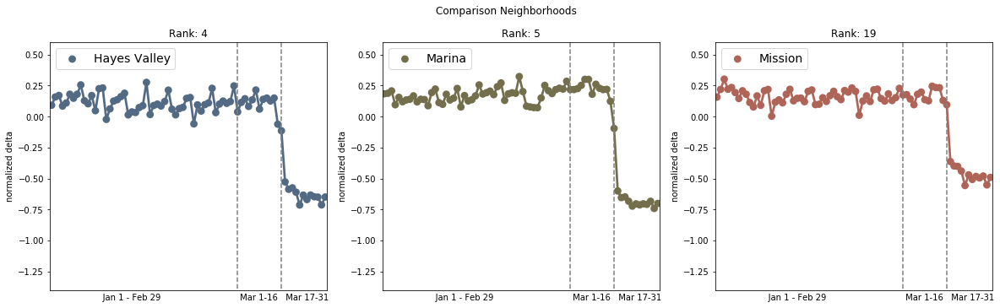

In [170]:
# plot other neighborhoods - yhat norm 
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,6))
fig.suptitle('Comparison Neighborhoods')
fig.subplots_adjust(hspace=0.2)

color_dict = dict({'Marina':'#736F4C',
                  'Inner Sunset':'#D9AF6B',
                  'Hayes Valley': '#526A83',
                  'Japantown': '#467378',
                   'Chinatown': '#855C75',
                    'Mission': '#AF6458'
                  })

for ax, nhood in zip(axes.flatten(), other_nhoods):
    # set up data
    n_final = final[final['nhood']==nhood]
    rank = str(nhood_viz[nhood_viz['nhood']==nhood]['rank'].item())
    n_final['x']=plt_dt.date2num(n_final.date) # fixes date number issue
    n_final['Neighborhood']=n_final['nhood']

    # plot
    sns.pointplot(ax=ax,x='x',y='delta_trend_norm', 
                    data=n_final, hue='Neighborhood',
                    palette=color_dict, marker='o')
    
        # format date ticks
    months = plt_dt.MonthLocator()
    month_fmt = plt_dt.DateFormatter('%B %d')
    ax.xaxis.set_major_locator(months)
    ax.xaxis.set_major_formatter(month_fmt)
    
    # plot params
    ax.set(title='Rank: '+rank, ylabel='normalized delta'
#                , xlabel='')
#                ,xlabel='                       Period 1                                  Period 2   Period 3')
                ,xlabel='                     Jan 1 - Feb 29                              Mar 1-16   Mar 17-31')
    ax.set_ylim(-1.4,.6)
    ax.axvline(63, -1.4,1,color='gray',ls='--')
    ax.axvline(51, -1.4,1,color='gray',ls='--')
    ax.legend(fontsize=14)


fig.autofmt_xdate()
plt.savefig("time_series_graphs/comparison_group_date_labels.png".format(nhood.replace('/',' '))) # save as png

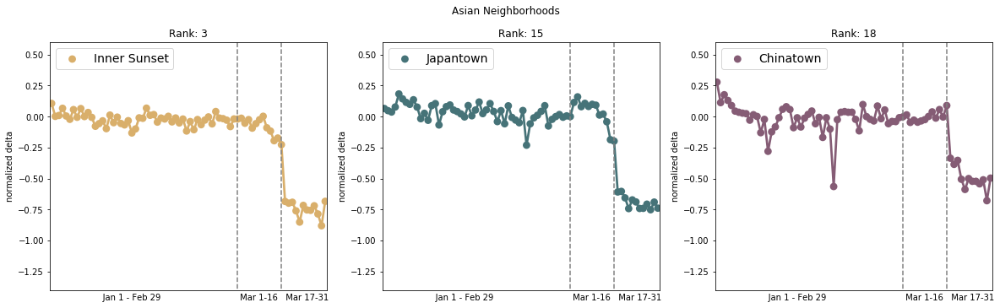

In [176]:
# plot asian neighborhoods - yhat norm 
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,6))
fig.suptitle('Asian Neighborhoods')
fig.subplots_adjust(hspace=0.2)

for ax, nhood in zip(axes.flatten(), asian_nhoods):
    # set up data
    n_final = final[final['nhood']==nhood]
    rank = str(nhood_viz[nhood_viz['nhood']==nhood]['rank'].item())
    n_final['x']=plt_dt.date2num(n_final.date) # fixes date number issue
    n_final['Neighborhood']=n_final['nhood']

    # plot
    sns.pointplot(ax=ax,x='x',y='delta_yhat_norm', 
                    data=n_final, hue='Neighborhood',
                    palette=color_dict)
    
    # plot params
    ax.set(title='Rank: '+rank, ylabel='normalized delta'
#                , xlabel='')
#                ,xlabel='                       Period 1                                  Period 2   Period 3')
                ,xlabel='                     Jan 1 - Feb 29                              Mar 1-16   Mar 17-31')
    ax.set_ylim(-1.4,.6)
    ax.axvline(63, -1.4,1,color='gray',ls='--')
    ax.axvline(51, -1.4,1,color='gray',ls='--')
    ax.legend(fontsize=14)
    
    # format date ticks
    months = plt_dt.MonthLocator()
    month_fmt = plt_dt.DateFormatter('%B %d')
    ax.xaxis.set_major_locator(months)
    ax.xaxis.set_major_formatter(month_fmt)

fig.autofmt_xdate()
plt.savefig("time_series_graphs/asian_group_date_labels.png".format(nhood.replace('/',' '))) # save as png

In [159]:
stats = final[final['date']>='2020-01-1']
stats=stats[['date','nhood','num_parking_meters','trend','yhat','avg_11','delta_trend_norm','delta_yhat_norm']]
stats.to_csv('data/time_series_analysis_output.csv')

In [ ]:
final=pd.read_csv('data/time_series_analysis_output.csv')

## ANOVA of three time periods
Jan 1 - Feb 29 : before COVID was in the Bay Area

Mar 1 - March 16 : before SF Shelter in Place official order

March 17 - March 30 : post SIP

In [36]:
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [38]:
# create new time categories:
# define date ranges
p1_start = datetime.datetime(2020, 1, 1)
p1_end = datetime.datetime(2020, 2, 29)
p2_start = datetime.datetime(2020, 3, 1)
p2_end = datetime.datetime(2020, 3, 16)
p3_start = datetime.datetime(2020, 3, 17)
p3_end = datetime.datetime(2020, 3, 30)

def label_period(row):
    if row['date'] >= p1_start and row['date'] <= p1_end:
        return 'p1'
    if row['date'] >= p2_start and row['date'] <= p2_end:
        return 'p2'
    if row['date'] >= p3_start and row['date'] <= p3_end:
        return 'p3'
    return np.nan

final['period']=final.apply(lambda row: label_period(row), axis=1)


In [60]:
# create category to easily subset by the 6 neighborhoods we want
# define date ranges
def label_neighborhoods(row):
    if row['nhood']=='Marina' or row['nhood']=='Hayes Valley' or row['nhood']=='Mission':
        return 'comparison'
    elif row['nhood']=='Chinatown' or row['nhood']=='Inner Sunset' or row['nhood']=='Japantown':
        return 'comparison'
    return 'other'

final['nhood_type']=final.apply(lambda row: label_neighborhoods(row), axis=1)

In [61]:
# split into period dfs
anova_df = final[final['nhood_type']=='comparison']
p1 = anova_df[anova_df['period']=='p1']
p1['delta_yhat_norm'] = p1.delta_yhat_norm.astype(float)
p2 = anova_df[anova_df['period']=='p2']
p2['delta_yhat_norm'] = p2.delta_yhat_norm.astype(float)
p3 = anova_df[anova_df['period']=='p3']
p3['delta_yhat_norm'] = p3.delta_yhat_norm.astype(float)

In [63]:
anova_p1 = ols('delta_yhat_norm ~ C(nhood)', data=p1).fit()
anova_p2 = ols('delta_yhat_norm ~ C(nhood)', data=p2).fit()
anova_p3 = ols('delta_yhat_norm ~ C(nhood)', data=p3).fit()

In [64]:
anova_p1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        delta_yhat_norm   R-squared:                       0.237
Model:                            OLS   Adj. R-squared:                  0.224
Method:                 Least Squares   F-statistic:                     18.59
Date:                Sat, 11 Apr 2020   Prob (F-statistic):           4.35e-16
Time:                        13:09:06   Log-Likelihood:                 391.91
No. Observations:                 306   AIC:                            -771.8
Df Residuals:                     300   BIC:                            -749.5
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                   -0.0114      0.010     -1.203      0.230      -0.030       0.007
C(nhood)[T.Hayes Valley]     0.0444      0.013      3.300      0.001       0.018       0.071
C(nhood)[T.Inner Sunset]    -0.0095      0.013     -0.708      0.479      -0.036       0.017
C(nhood)[T.Japantown]        0.0441      0.013      3.279      0.001       0.018       0.071
C(nhood)[T.Marina]           0.0909      0.013      6.760      0.000       0.064       0.117
C(nhood)[T.Mission]          0.0818      0.013      6.083      0.000       0.055       0.108
==============================================================================
Omnibus:                      172.497   Durbin-Watson:                   1.348
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3437.502
Skew:                          -1.848   Prob(JB):                         0.00
Kurtosis:                      18.998   Cond. No.                         6.85
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [65]:
anova_p2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        delta_yhat_norm   R-squared:                       0.391
Model:                            OLS   Adj. R-squared:                  0.348
Method:                 Least Squares   F-statistic:                     9.231
Date:                Sat, 11 Apr 2020   Prob (F-statistic):           8.01e-07
Time:                        13:10:13   Log-Likelihood:                 88.139
No. Observations:                  78   AIC:                            -164.3
Df Residuals:                      72   BIC:                            -150.1
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                    0.0002      0.023      0.009      0.993      -0.045       0.045
C(nhood)[T.Hayes Valley]     0.0153      0.032      0.479      0.633      -0.048       0.079
C(nhood)[T.Inner Sunset]    -0.0836      0.032     -2.621      0.011      -0.147      -0.020
C(nhood)[T.Japantown]        0.0260      0.032      0.815      0.418      -0.038       0.090
C(nhood)[T.Marina]           0.1156      0.032      3.624      0.001       0.052       0.179
C(nhood)[T.Mission]          0.0776      0.032      2.431      0.018       0.014       0.141
==============================================================================
Omnibus:                       29.617   Durbin-Watson:                   1.067
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               50.229
Skew:                          -1.493   Prob(JB):                     1.24e-11
Kurtosis:                       5.557   Cond. No.                         6.85
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [67]:
anova_p3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        delta_yhat_norm   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.651
Method:                 Least Squares   F-statistic:                     27.45
Date:                Sat, 11 Apr 2020   Prob (F-statistic):           6.48e-15
Time:                        13:11:10   Log-Likelihood:                 88.321
No. Observations:                  72   AIC:                            -164.6
Df Residuals:                      66   BIC:                            -151.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                   -0.4950      0.021    -23.134      0.000      -0.538      -0.452
C(nhood)[T.Hayes Valley]    -0.2186      0.030     -7.225      0.000      -0.279      -0.158
C(nhood)[T.Inner Sunset]    -0.2534      0.030     -8.376      0.000      -0.314      -0.193
C(nhood)[T.Japantown]       -0.1999      0.030     -6.607      0.000      -0.260      -0.140
C(nhood)[T.Marina]          -0.2833      0.030     -9.362      0.000      -0.344      -0.223
C(nhood)[T.Mission]         -0.0657      0.030     -2.171      0.034      -0.126      -0.005
==============================================================================
Omnibus:                        1.194   Durbin-Watson:                   1.474
Prob(Omnibus):                  0.550   Jarque-Bera (JB):                0.697
Skew:                          -0.218   Prob(JB):                        0.706
Kurtosis:                       3.205   Cond. No.                         6.85
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [68]:
# create category to easily subset the 6 neighborhoods into asian/nonasian
# define date ranges
def label_neighborhood_asian(row):
    if row['nhood']=='Marina' or row['nhood']=='Hayes Valley' or row['nhood']=='Mission':
        return 'comparison'
    elif row['nhood']=='Chinatown' or row['nhood']=='Inner Sunset' or row['nhood']=='Japantown':
        return 'asian'
    return 'other'

anova_df['nhood_asian_type']=anova_df.apply(lambda row: label_neighborhood_asian(row), axis=1)

In [70]:
# run comparison of all asian neighborhoods to other 3 non-asian neighborhoods in comparison group 
p1 = anova_df[anova_df['period']=='p1']
p1['delta_yhat_norm'] = p1.delta_yhat_norm.astype(float)
p2 = anova_df[anova_df['period']=='p2']
p2['delta_yhat_norm'] = p2.delta_yhat_norm.astype(float)
p3 = anova_df[anova_df['period']=='p3']
p3['delta_yhat_norm'] = p3.delta_yhat_norm.astype(float)

In [72]:
anova_p1_b = ols('delta_yhat_norm ~ C(nhood_asian_type)', data=p1).fit()
anova_p2_b = ols('delta_yhat_norm ~ C(nhood_asian_type)', data=p2).fit()
anova_p3_b = ols('delta_yhat_norm ~ C(nhood_asian_type)', data=p3).fit()

In [73]:
anova_p1_b.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        delta_yhat_norm   R-squared:                       0.156
Model:                            OLS   Adj. R-squared:                  0.153
Method:                 Least Squares   F-statistic:                     56.30
Date:                Sat, 11 Apr 2020   Prob (F-statistic):           6.92e-13
Time:                        13:25:03   Log-Likelihood:                 376.61
No. Observations:                 306   AIC:                            -749.2
Df Residuals:                     304   BIC:                            -741.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                          8.755e-05      0.006      0.015      0.988      -0.011       0.011
C(nhood_asian_type)[T.comparison]     0.0608      0.008      7.503      0.000       0.045       0.077
==============================================================================
Omnibus:                      155.013   Durbin-Watson:                   1.224
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2526.973
Skew:                          -1.650   Prob(JB):                         0.00
Kurtosis:                      16.686   Cond. No.                         2.62
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [74]:
anova_p2_b.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        delta_yhat_norm   R-squared:                       0.196
Model:                            OLS   Adj. R-squared:                  0.186
Method:                 Least Squares   F-statistic:                     18.55
Date:                Sat, 11 Apr 2020   Prob (F-statistic):           4.88e-05
Time:                        13:25:23   Log-Likelihood:                 77.340
No. Observations:                  78   AIC:                            -150.7
Df Residuals:                      76   BIC:                            -146.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                            -0.0190      0.015     -1.305      0.196      -0.048       0.010
C(nhood_asian_type)[T.comparison]     0.0887      0.021      4.307      0.000       0.048       0.130
==============================================================================
Omnibus:                       13.432   Durbin-Watson:                   0.856
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               14.758
Skew:                          -0.900   Prob(JB):                     0.000624
Kurtosis:                       4.140   Cond. No.                         2.62
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [75]:
anova_p3_b.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        delta_yhat_norm   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.676
Date:                Sat, 11 Apr 2020   Prob (F-statistic):              0.200
Time:                        13:25:29   Log-Likelihood:                 48.680
No. Observations:                  72   AIC:                            -93.36
Df Residuals:                      70   BIC:                            -88.81
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                            -0.6461      0.021    -31.059      0.000      -0.688      -0.605
C(nhood_asian_type)[T.comparison]    -0.0381      0.029     -1.294      0.200      -0.097       0.021
==============================================================================
Omnibus:                        3.746   Durbin-Watson:                   0.565
Prob(Omnibus):                  0.154   Jarque-Bera (JB):                3.691
Skew:                           0.536   Prob(JB):                        0.158
Kurtosis:                       2.712   Cond. No.                         2.62
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

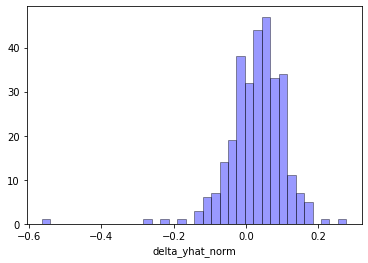

In [76]:
sns.distplot(p1['delta_yhat_norm'], hist=True, kde=False, 
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})

In [78]:
p1.columns

Index(['start_date_new', 'nhood', 'num_parking_meters', 'wday', 'date',
       'month', 'avg_11', 'avg_12', 'yhat', 'trend', 'yhat_lower',
       'yhat_upper', 'day_of_week', 'delta_trend', 'delta_yhat',
       'delta_trend_norm', 'delta_yhat_norm', 'period', 'nhood_type',
       'nhood_asian_type'],
      dtype='object')

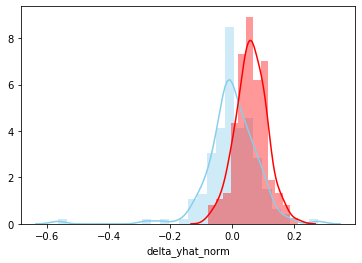

In [80]:
p1_a = p1[p1['nhood_asian_type']=='asian']
p1_c = p1[p1['nhood_asian_type']=='comparison']
sns.distplot(p1_a["delta_yhat_norm"] , color="skyblue", label="Sepal Length")
sns.distplot(p1_c["delta_yhat_norm"] , color="red", label="Sepal Width")


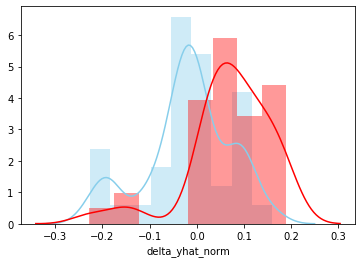

In [81]:
p2_a = p2[p2['nhood_asian_type']=='asian']
p2_c = p2[p2['nhood_asian_type']=='comparison']
sns.distplot(p2_a["delta_yhat_norm"] , color="skyblue", label="Sepal Length")
sns.distplot(p2_c["delta_yhat_norm"] , color="red", label="Sepal Width")


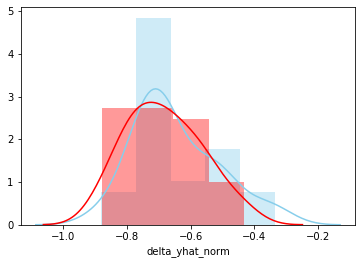

In [82]:
p3_a = p3[p3['nhood_asian_type']=='asian']
p3_c = p3[p3['nhood_asian_type']=='comparison']
sns.distplot(p3_a["delta_yhat_norm"] , color="skyblue", label="Sepal Length")
sns.distplot(p3_c["delta_yhat_norm"] , color="red", label="Sepal Width")


In [84]:
# look into bimodal P2
# create new time categories:
# define date ranges
p1_start = datetime.datetime(2020, 3, 1)
p1_end = datetime.datetime(2020, 3, 4)
p2_start = datetime.datetime(2020, 3, 5)
p2_end = datetime.datetime(2020, 3, 16)

def label_period_march5(row):
    if row['date'] >= p1_start and row['date'] <= p1_end:
        return 'before'
    if row['date'] >= p2_start and row['date'] <= p2_end:
        return 'after'
    return np.nan

p2['march5']=p2.apply(lambda row: label_period_march5(row), axis=1)

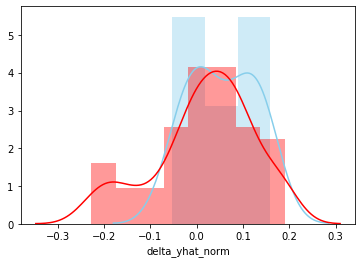

In [85]:
p2_before = p2[p2['march5']=='before']
p2_after = p2[p2['march5']=='after']
sns.distplot(p2_before["delta_yhat_norm"] , color="skyblue", label="Sepal Length")
sns.distplot(p2_after["delta_yhat_norm"] , color="red", label="Sepal Width")


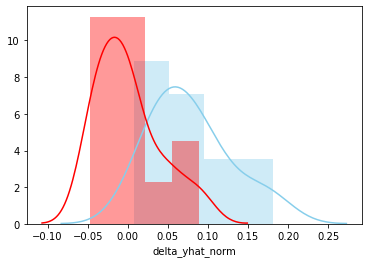

In [86]:
# by neighborhood
p2_mission = p2[p2['nhood']=='Mission']
p2_chinatown = p2[p2['nhood']=='Chinatown']
sns.distplot(p2_mission["delta_yhat_norm"] , color="skyblue", label="Sepal Length")
sns.distplot(p2_chinatown["delta_yhat_norm"] , color="red", label="Sepal Width")


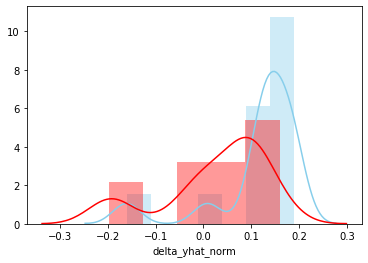

In [87]:
# by neighborhood
p2_marina = p2[p2['nhood']=='Marina']
p2_japantown = p2[p2['nhood']=='Japantown']
sns.distplot(p2_marina["delta_yhat_norm"] , color="skyblue", label="Sepal Length")
sns.distplot(p2_japantown["delta_yhat_norm"] , color="red", label="Sepal Width")


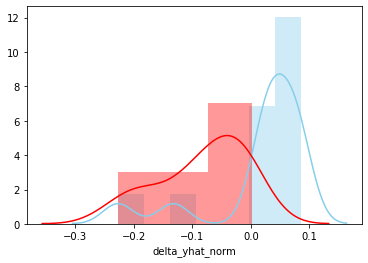

In [88]:
# by neighborhood
p2_hv = p2[p2['nhood']=='Hayes Valley']
p2_is = p2[p2['nhood']=='Inner Sunset']
sns.distplot(p2_hv["delta_yhat_norm"] , color="skyblue", label="Sepal Length")
sns.distplot(p2_is["delta_yhat_norm"] , color="red", label="Sepal Width")


In [181]:
for_export = anova_df[['date', 'nhood', 'num_parking_meters', 'avg_11', 'yhat', 'trend',
        'delta_trend', 'delta_yhat','delta_trend_norm', 'delta_yhat_norm', 'period', 'nhood_asian_type']]

In [184]:
for_export.rename(columns={'nhood_asian_type': 'nhood_type'}, inplace=True)

In [187]:
for_export.to_csv('data/final_output_6nhoods.csv')

In [188]:
for_export

,date,nhood,num_parking_meters,avg_11,yhat,trend,delta_trend,delta_yhat,delta_trend_norm,delta_yhat_norm,period,nhood_type
1,2020-01-02,Chinatown,2738,2177.269231,2132.588566,2016.985236,721.015,605.411,0.331156,0.27806,p1,asian
2,2020-01-03,Chinatown,2422,2177.269231,2176.687963,2016.064991,405.935,245.312,0.186442,0.11267,p1,asian
3,2020-01-04,Chinatown,2587,2177.269231,2202.818609,2015.144745,571.855,384.181,0.262648,0.176451,p1,asian
4,2020-01-06,Chinatown,2454,2177.269231,2171.067195,2013.304254,440.696,282.933,0.202408,0.129948,p1,asian
5,2020-01-07,Chinatown,2335,2177.269231,2140.645904,2012.384008,322.616,194.354,0.148175,0.0892651,p1,asian
6,2020-01-08,Chinatown,2246,2177.269231,2149.855257,2011.463763,234.536,96.1447,0.10772,0.0441584,p1,asian
7,2020-01-09,Chinatown,2202,2177.269231,2126.146847,2010.543517,191.456,75.8532,0.0879342,0.0348387,p1,asian
8,2020-01-10,Chinatown,2231,2177.269231,2170.246244,2009.623272,221.377,60.7538,0.101676,0.0279036,p1,asian
9,2020-01-11,Chinatown,2248,2177.269231,2196.376890,2008.703026,239.297,51.6231,0.109907,0.02371,p1,asian
10,2020-01-13,Chinatown,2102,2177.269231,2164.625476,2006.862535,95.1375,-62.6255,0.0436958,-0.0287633,p1,asian
